# El XOR

> a) Escriba una función que genere (aleatoriamente) $n$ datos etiquetados de la forma $\{(x_1, y_1),...,(x_n, y_n)\},
x_i \in \mathbb{R}^2, y_i \in \{0,1\}$, con una distribución de probabilidad que refleje la configuración linealmente inseparable que muestra la figura. Utilice esta función para crear $1000$ datos de entrenamiento y $1000$ datos de pruebas. Para medir la tendencia de los modelos a sobre-ajuste, agregue un $10\%$ de ruido al dataset de entrenamiento, generando $x's$ cercanos a la frontera e invirtiendo la etiqueta correcta de este subconjunto. Genere un gráfico que muestre sus datos de entrenamiento y pruebas, identificando cada clase con un color diferente. ¿Porqué tiene sentido denominar este problema XOR?.

In [4]:
import numpy as np

def do_XOR(n=1000,noisy_n=100,svm=False):
    rng = np.random.RandomState(0)
    X_train = rng.uniform(low=-1.0,high=1.0,size=(n,2))
    Y_train = np.logical_xor(X_train[:,0] > 0, X_train[:,1] > 0)
    Y_train = 2*Y_train-1 if svm else Y_train
    X_noisy= rng.uniform(low=-0.8,high=0.2,size=(noisy_n,2))
    Y_noisy = -1*np.logical_xor(X_noisy[:,0] > 0, X_noisy[:,1] > 0) + 1
    Y_noisy = 2*Y_noisy-1 if svm else Y_noisy
    X_train = np.vstack((X_train, X_noisy))
    Y_train = np.hstack((Y_train, Y_noisy))
    X_test = rng.uniform(low=-1.0,high=1.0,size=(n,2))
    Y_test = np.logical_xor(X_test[:,0] > 0, X_test[:,1] > 0)
    Y_test = 2*Y_test - 1 if svm else Y_test
    return X_train,Y_train,X_test,Y_test

X_train, Y_train, X_test, Y_test = do_XOR()

En el siguiente grafico se distinguen las 2 clases con los colores *rojo* y *azul*, con el objetivo de generar un mayor contraste. Además, se distingue el conjunto de entrenamiento (train set) representado por *cruces*, del conjunto de prueba (test set) representado por *puntos*.

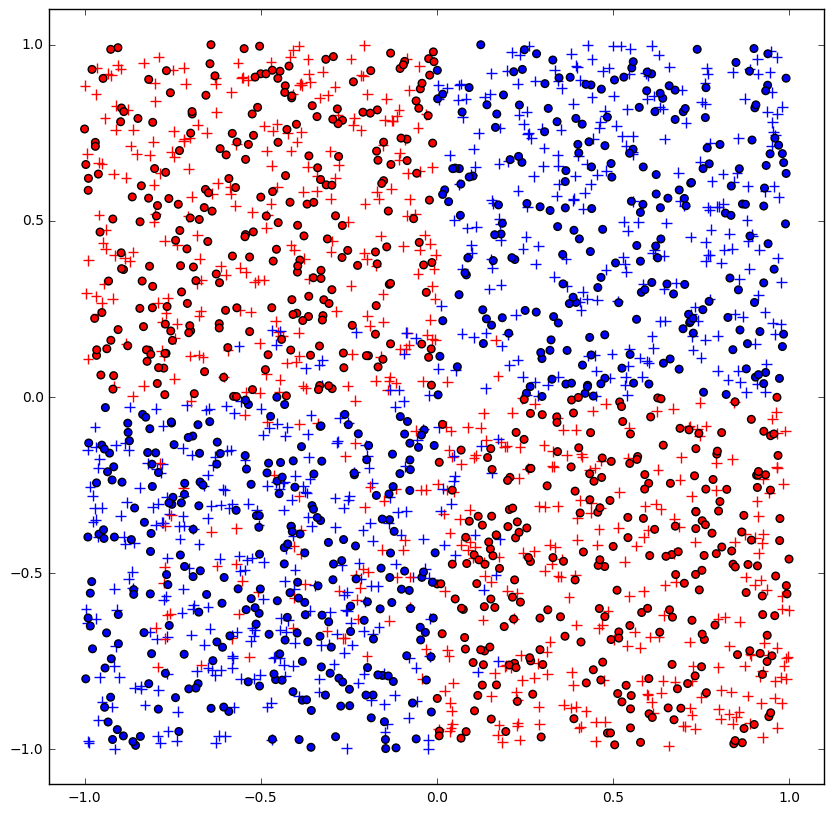

In [5]:
from matplotlib import pyplot as plt

f, axis = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(10, 10))
axis.scatter(X_train[:,0], X_train[:,1], s=60, c=Y_train, zorder=10, marker='+', cmap='bwr') #Conjunto de entrenamiento
axis.scatter(X_test[:,0], X_test[:,1], s=30, c=Y_test, zorder=10, cmap='bwr') #Conjuto de prueba
plt.axis([-1.1, 1.1, -1.1, 1.1])
plt.show()

# Para visualizar solo un conjunto, comente el conjunto que NO quiere visualizar y ejecute.

Al problema anterior se le denomina *XOR* (disyunción exclusiva) debido a que a grandes rasgos la clase a la que pertence un punto esta determinada por una operacion de disyunción exlusiva respecto al cuadrante en donde se encuentra, como se presenta en la siguiente imagen.

![title](XOR.png)

# SVM Lineal

> b) Demuestre **experimentalmente** que una *SVM lineal* no puede resolver satisfactoriamente el problema anterior. Sea convincente: por ejemplo, intente modificar los parámetros de la máquina de aprendizaje, reportando métricas que permitan evaluar el desempeño del modelo en el problema. Escriba
también una función, denominada *plot_classifier* que represente gráficamente la solución encontrada por
la máquina de aprendizaje, representando los datos de entrenamiento y pruebas (asociando un color a
la clase que les corresponde), además de la frontera de clasificación. Describa y explique lo que observa,
reportando gráficos de la solución sólo para algunos casos representativos.

In [6]:
import matplotlib.pyplot as plt

def plot_classifier(clf, X_train, Y_train, X_test, Y_test, model_type):
    f, axis = plt.subplots(1, 1, sharex='col', sharey='row',figsize=(20, 20))
    axis.scatter(X_train[:,0], X_train[:,1], s=60, c=Y_train,zorder=10, marker='+', cmap='bwr')
    axis.scatter(X_test[:,0], X_test[:,1], s=30, c=Y_test,zorder=10, cmap='bwr')
    XX, YY = np.mgrid[-1:1:200j, -1:1:200j]
    if model_type == 'svm':
        Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()])
    elif model_type == 'tree':
        Z = clf.predict_proba(np.c_[XX.ravel(), YY.ravel()])[:,0]
    elif model_type == 'ann':
        Z = clf.predict(np.c_[XX.ravel(), YY.ravel()])
    else: raise ValueError('model type not supported')
    Z = Z.reshape(XX.shape)
    Zplot = Z > 0 if model_type == 'svm' else Z > 0.5
    axis.pcolormesh(XX, YY, Zplot ,cmap='YlGn')
    axis.contour(XX, YY, Z, alpha=1, colors=['k', 'k', 'k'],
        linestyles=['--', '-', '--'],levels=[-1, 0, 1])
    plt.show()

In [7]:
from sklearn.metrics import classification_report

def score_the_model(model, x, y, xt, yt, text):
    acc_tr = model.score(x,y)
    acc_test = model.score(xt[:-1], yt[:-1])
    print "Training Accuracy %s: %f"%(text, acc_tr)
    print "Test Accuracy %s: %f"%(text, acc_test)
    print "Training Error: %f"%(1 - acc_tr)
    print "Test Error: %f"%(1 - acc_test)
    print "Detailed Analysis Testing Results ..."
    print(classification_report(yt, model.predict(xt), target_names=['+','-']))
    
    return acc_test

Para este análisis variaremos el parámetro de penalización $C$ usando diferentes potencias de $10$, más específicamente evaluaremos con $C = 10^k$ con $k$ en el intervalo $[-1, 5]$.

In [8]:
from sklearn.svm import LinearSVC

def do_SVM(x, y, xt, yt):
    
    Cs = [0.1, 1, 10, 100, 1000, 10000, 100000]
    datos = (0,0)
    
    for C in Cs:
        print("\n")
        print "El valor de C que se esta probando: %f"%C
        model = LinearSVC(C=C)
        model = model.fit(x, y)
        accuracy = score_the_model(model, x, y, xt, yt, "SVM")
        if accuracy >= datos[0]:
            datos = (accuracy, C)
        print("-------------------------------------------")
        
    print "\n El mejor test accuracy es de %f al parametro de penalizacion C = %f"%datos

In [9]:
do_SVM(X_train, Y_train, X_test, Y_test)



El valor de C que se esta probando: 0.100000
Training Accuracy SVM: 0.517273
Test Accuracy SVM: 0.471471
Training Error: 0.482727
Test Error: 0.528529
Detailed Analysis Testing Results ...
             precision    recall  f1-score   support

          +       0.46      0.47      0.46       489
          -       0.48      0.48      0.48       511

avg / total       0.47      0.47      0.47      1000

-------------------------------------------


El valor de C que se esta probando: 1.000000
Training Accuracy SVM: 0.517273
Test Accuracy SVM: 0.471471
Training Error: 0.482727
Test Error: 0.528529
Detailed Analysis Testing Results ...
             precision    recall  f1-score   support

          +       0.46      0.47      0.46       489
          -       0.48      0.48      0.48       511

avg / total       0.47      0.47      0.47      1000

-------------------------------------------


El valor de C que se esta probando: 10.000000
Training Accuracy SVM: 0.517273
Test Accuracy SVM: 0

C:\Users\david\Anaconda3\envs\python27\lib\site-packages\sklearn\metrics\classification.py:1074: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Observamos que el mejor *Accuracy* se encentra para $C=10000$. A continuación presentamos los gráficos de los casos mas representativos.

Test Accuracy = 0.471000


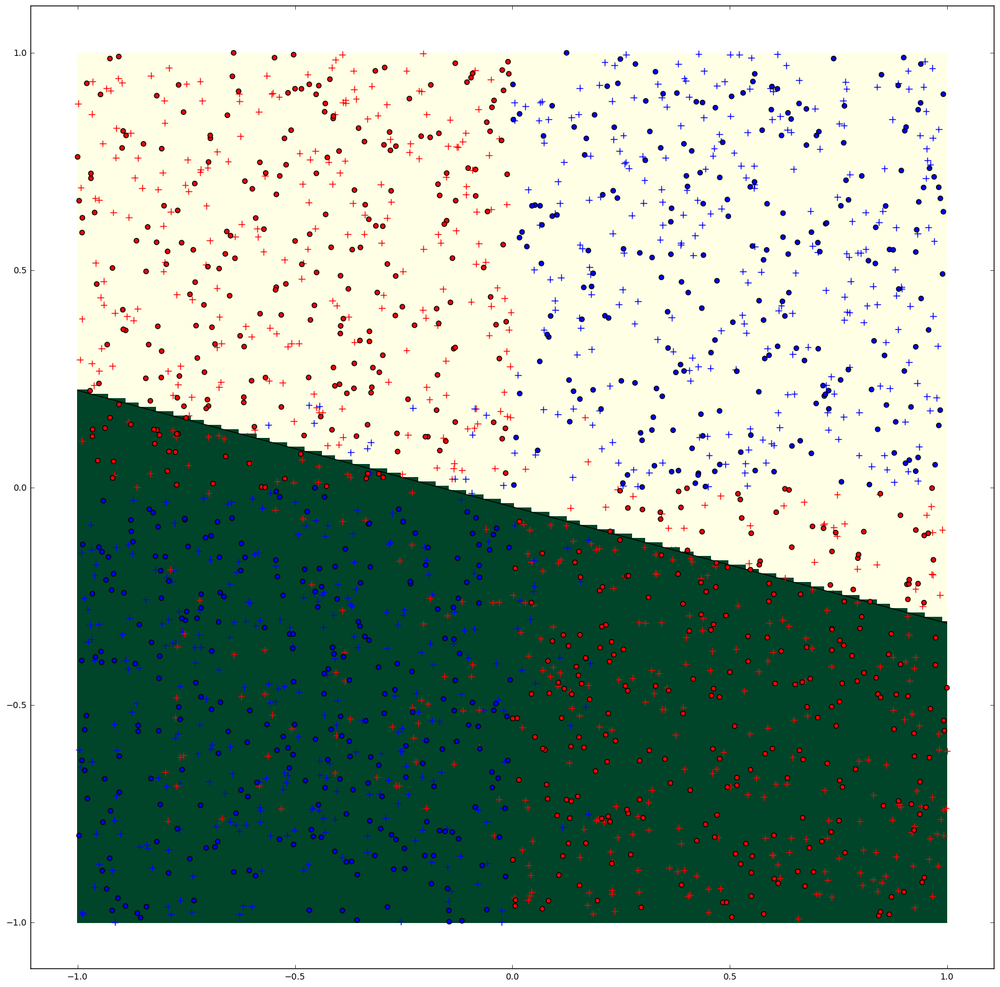

In [10]:
clf = LinearSVC(C=10)
clf.fit(X_train, Y_train)

print "Test Accuracy = %f"%clf.score(X_test, Y_test)
plot_classifier(clf, X_train, Y_train, X_test, Y_test,'svm')

Test Accuracy = 0.485000


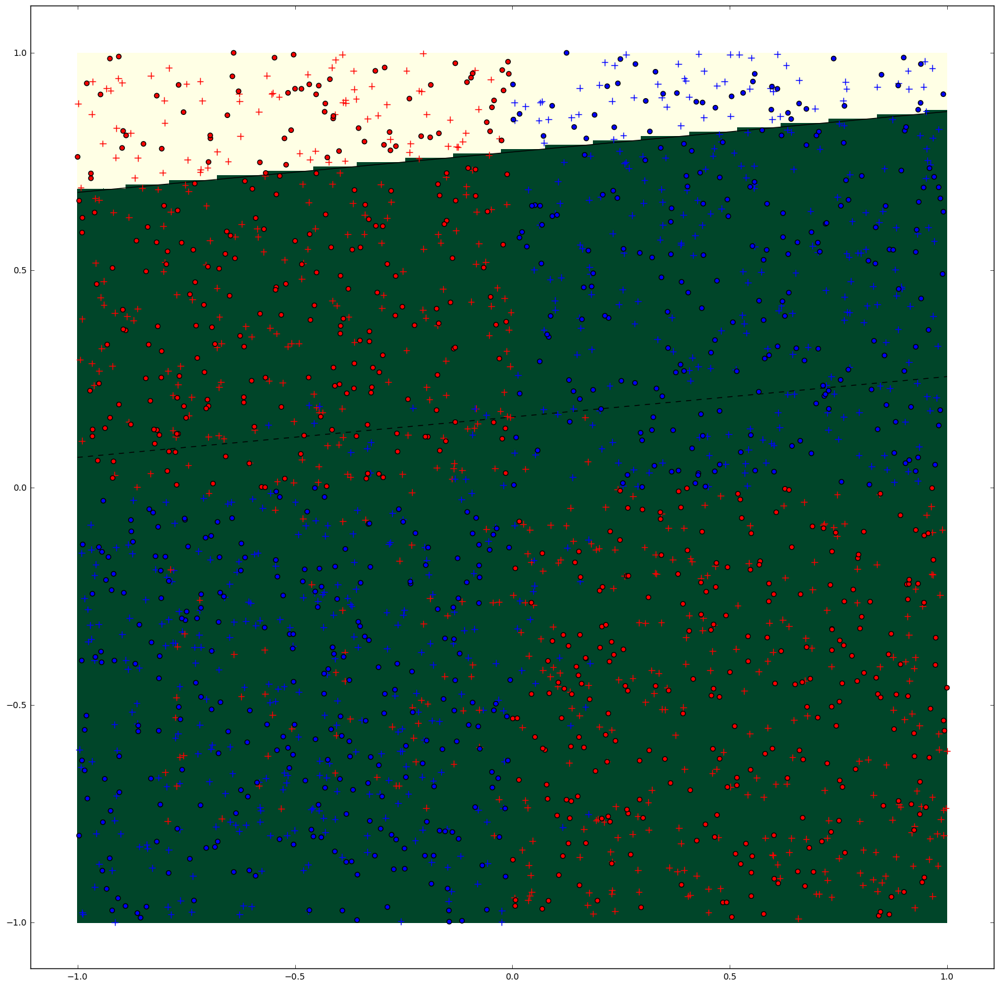

In [11]:
clf = LinearSVC(C=10000)
clf.fit(X_train, Y_train)

print "Test Accuracy = %f"%clf.score(X_test, Y_test)
plot_classifier(clf, X_train, Y_train, X_test, Y_test,'svm')

Test Accuracy = 0.511000


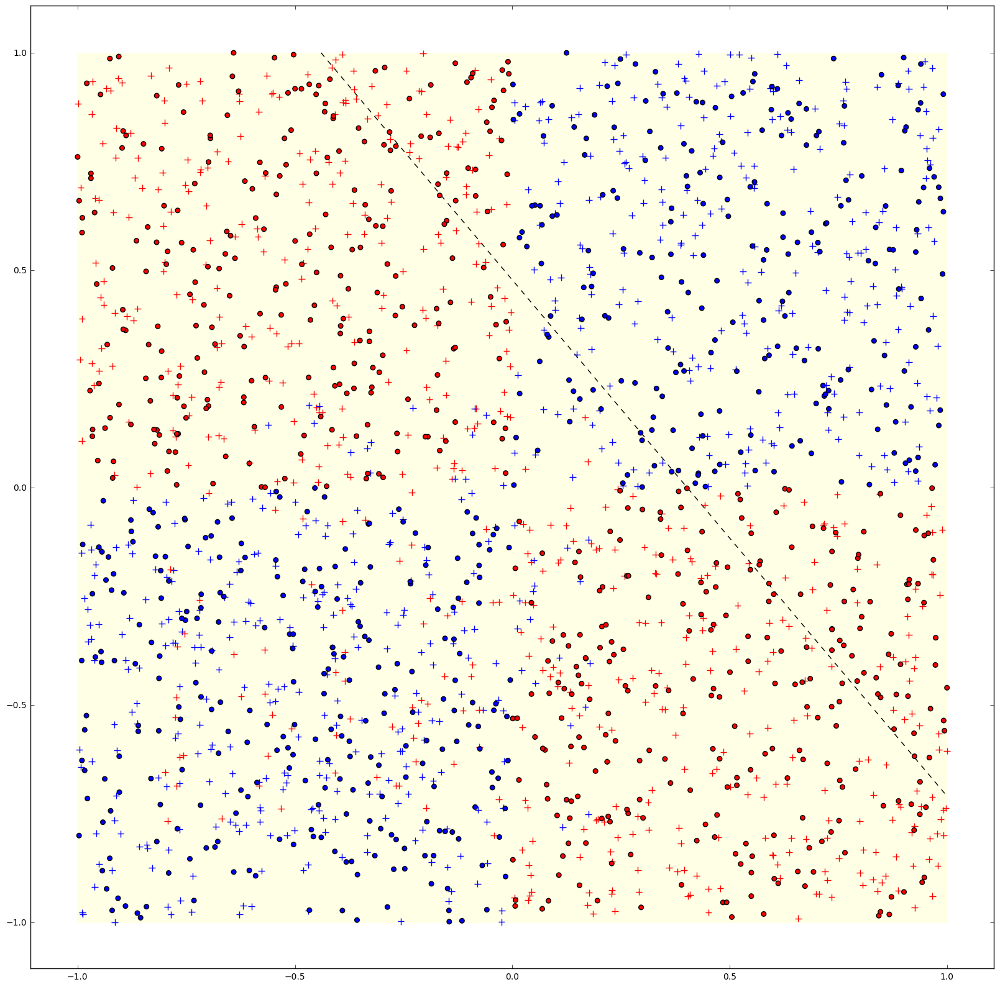

In [12]:
clf = LinearSVC(C=100000)
clf.fit(X_train, Y_train)

print "Test Accuracy = %f"%clf.score(X_test, Y_test)
plot_classifier(clf, X_train, Y_train, X_test, Y_test,'svm')

Sin embargo es importante destacar  que la SVM lineal no siempre entrega el mismo resultado para un parámetro $C$, por lo que en ocasiones existen otros parámetros $C$ que otorgan el mejor resultado,  pero en general $C=10000$ tiende a ser el más frecuente.  

Finalmente, y a partir de los gráficos anteriores observamos que no es posible separar las clases utilizando una *SVM* lineal. Esto es esperable ya que no existe una línea recta que sea capaz de separar las clases de forma eficaz. 

# SVM No Lineal

> c) Demuestre **experimentalmente** que una SVM con kernel no-lineal puede resolver satisfactoriamente el
problema. Para esta actividad, use los hiper-parámetros que se entregan como referencia en el código de ejemplo (muestre resultados tanto para el kernel Polynomial como para el kernel RBF). Cambie el valor del parámetro $C$ eligiendo $k$ en el intervalo $[-2, 4]$ (con saltos de 1 unidad) y asignando al parámetro el valor $C = 2^k$. Describa y explique lo que observa, graficando el error de entrenamiento y pruebas como
función de $C$. Utilice la función *plot_classifier*, diseñada en el ítem anterior, para construir gráficos de la solución con distintos valores de $C$.

Test Accuracy = 0.980000


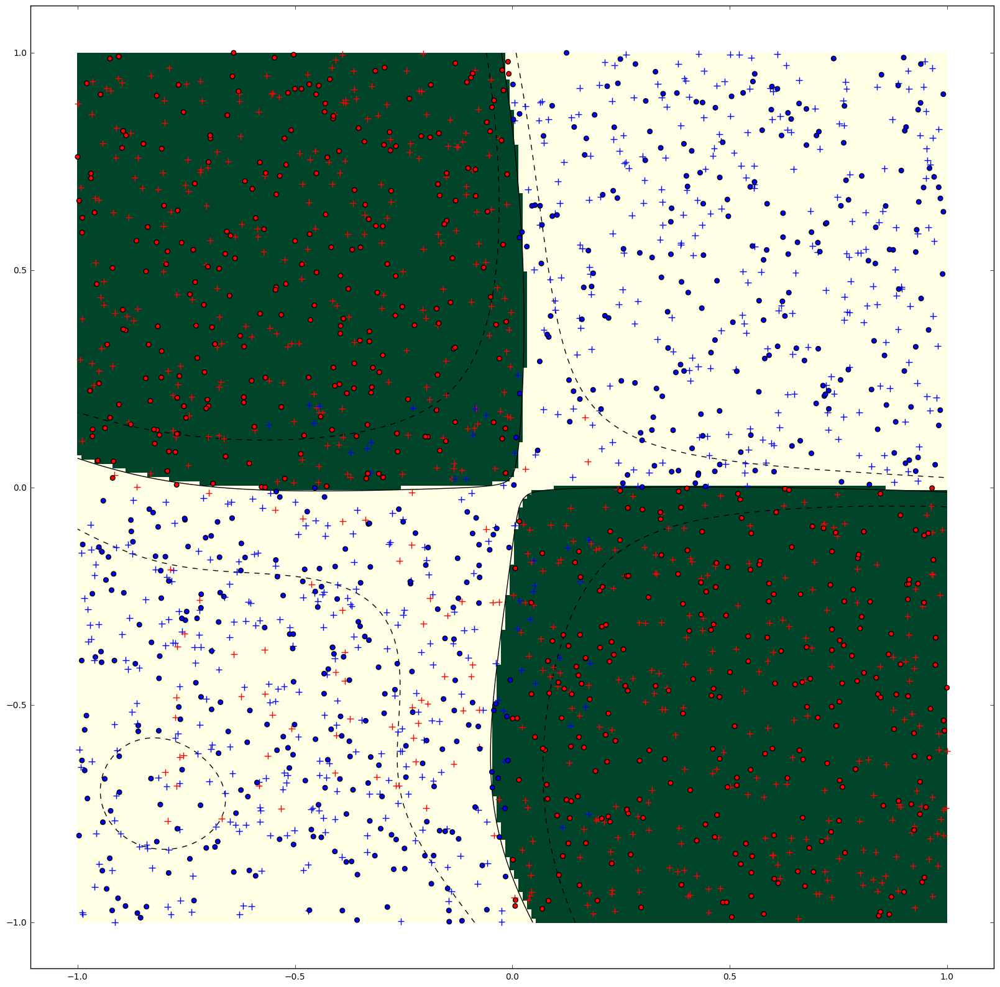

In [13]:
from sklearn.svm import SVC

#Utiliazando el kernel RBF

clf = SVC(C=100, kernel='rbf')
clf.fit(X_train, Y_train)

print "Test Accuracy = %f"%clf.score(X_test, Y_test)
plot_classifier(clf,X_train,Y_train,X_test,Y_test,'svm')

Test Accuracy = 0.954000


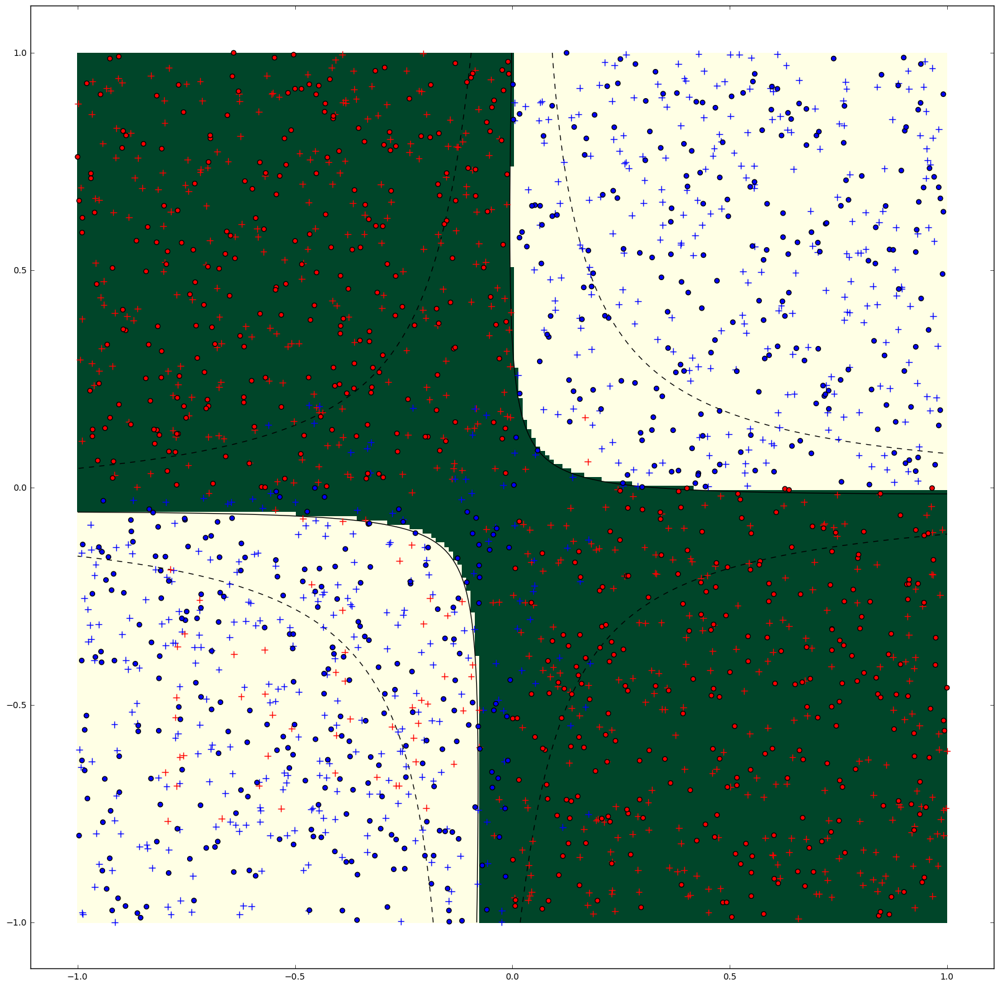

In [14]:
#Utiliazando el kernel Polinomial

clf = SVC(C=10, kernel='poly', degree=2, coef0=1)
clf.fit(X_train, Y_train)

print "Test Accuracy = %f"%clf.score(X_test, Y_test)
plot_classifier(clf,X_train,Y_train,X_test,Y_test,'svm')

Observamos que con ambos kernel se resuelve el problema, ahora observamos el comportamiento de ambos metodos en funcion del parametro *C*.

kernel RBF con C = 0.250000
Train Accuracy = 0.885455
Test Accuracy = 0.944000


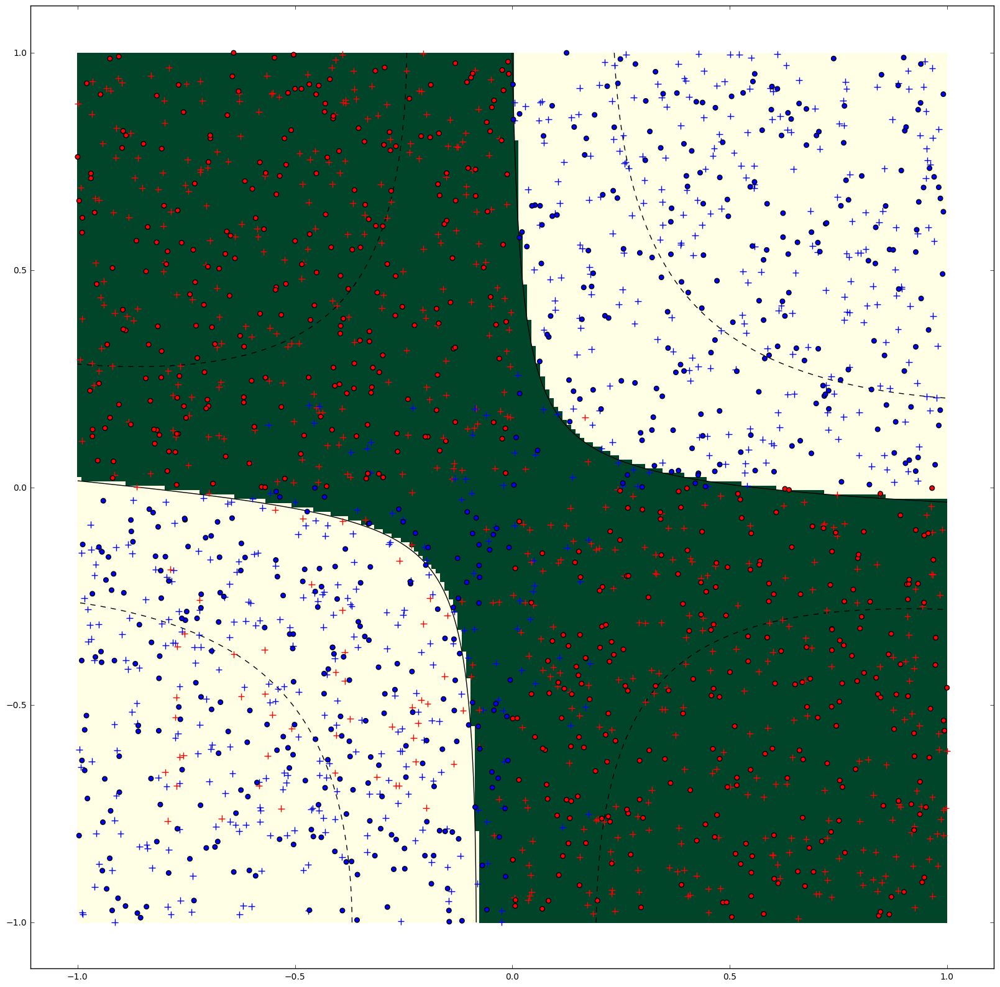



kernel RBF con C = 0.500000
Train Accuracy = 0.890000
Test Accuracy = 0.959000


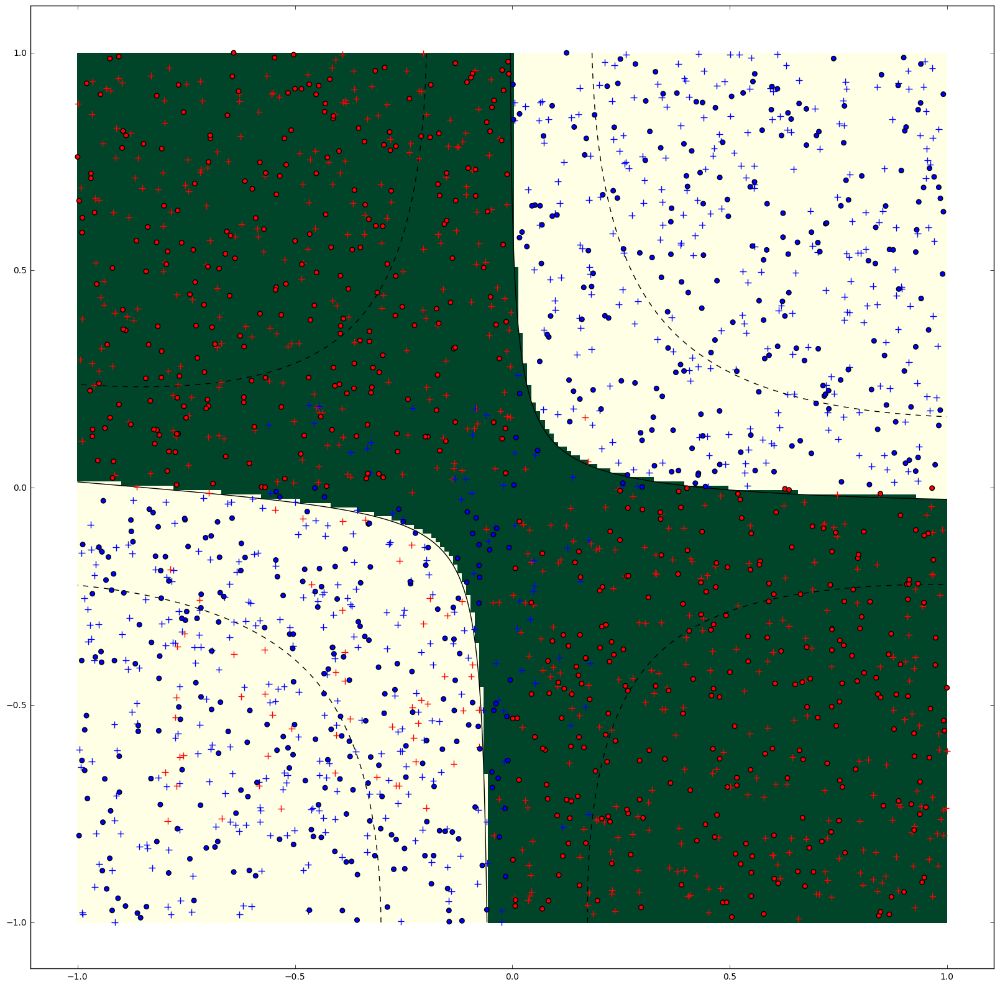



kernel RBF con C = 1.000000
Train Accuracy = 0.887273
Test Accuracy = 0.954000


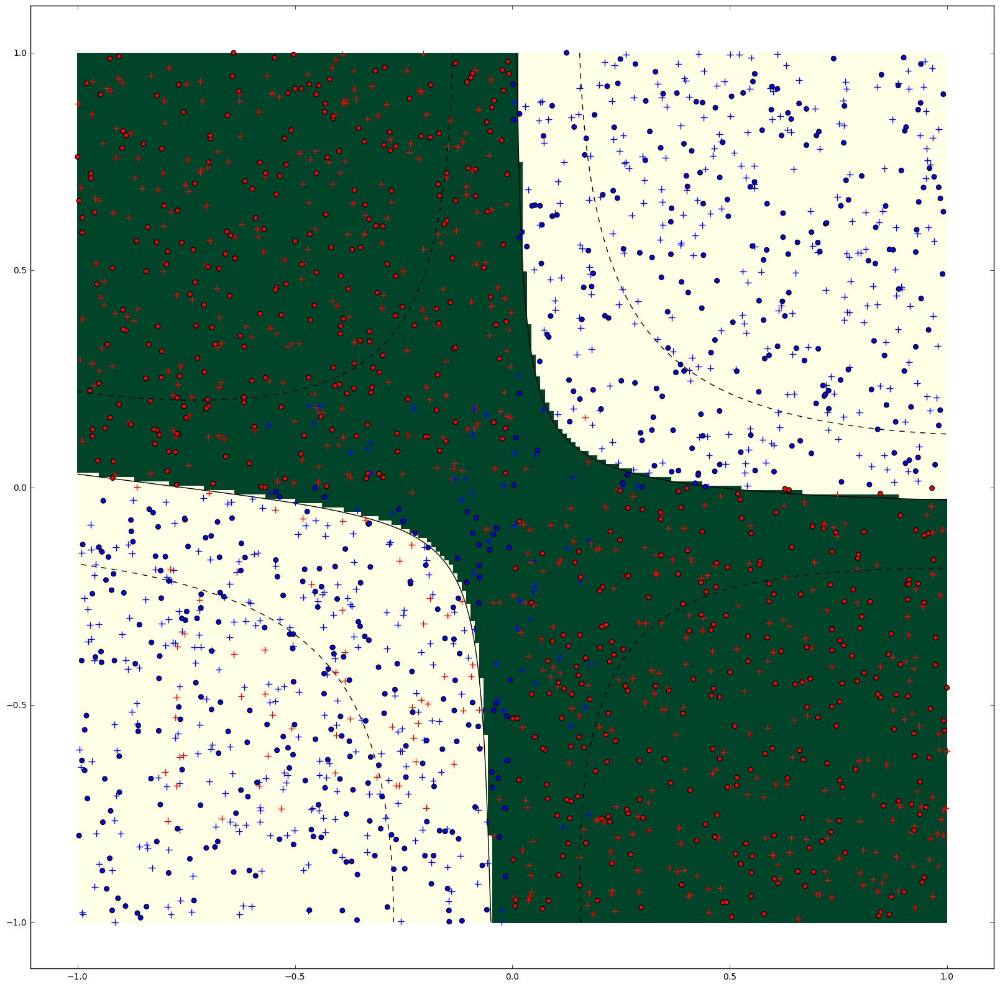



kernel RBF con C = 2.000000
Train Accuracy = 0.890909
Test Accuracy = 0.959000


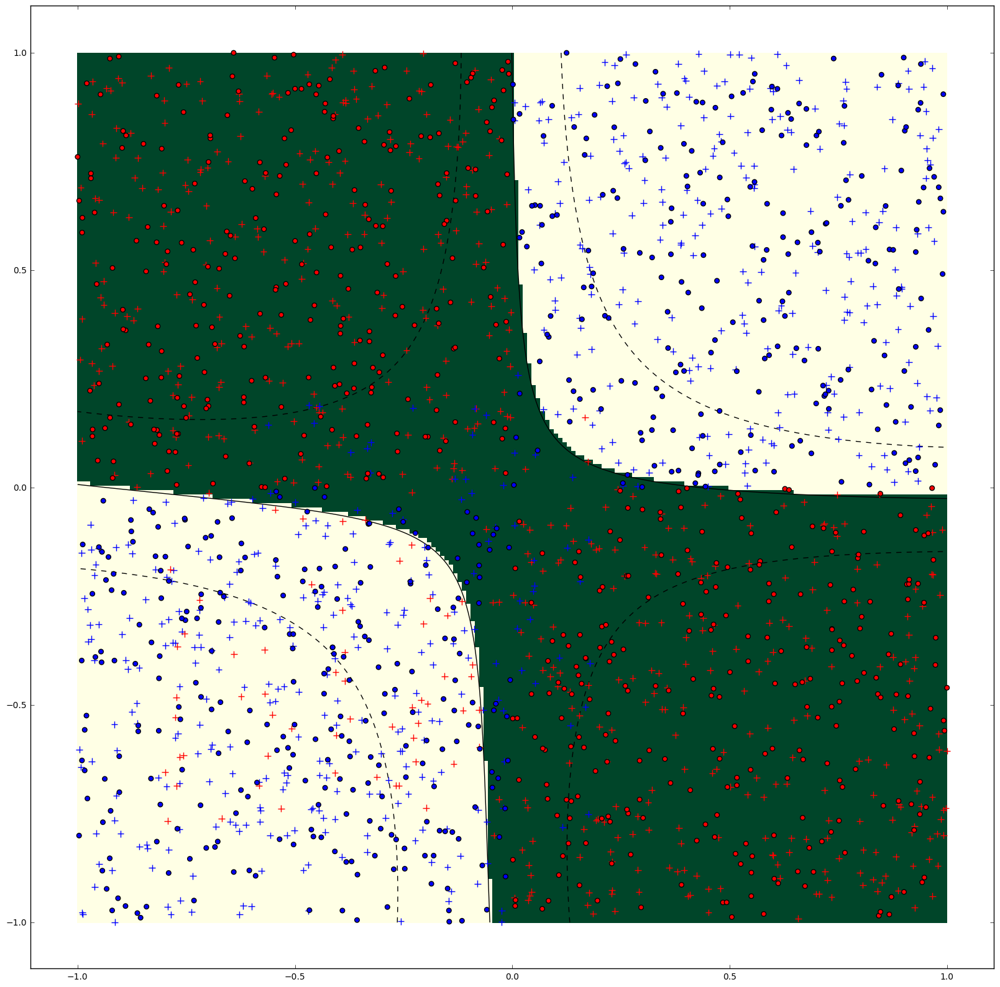



kernel RBF con C = 4.000000
Train Accuracy = 0.901818
Test Accuracy = 0.970000


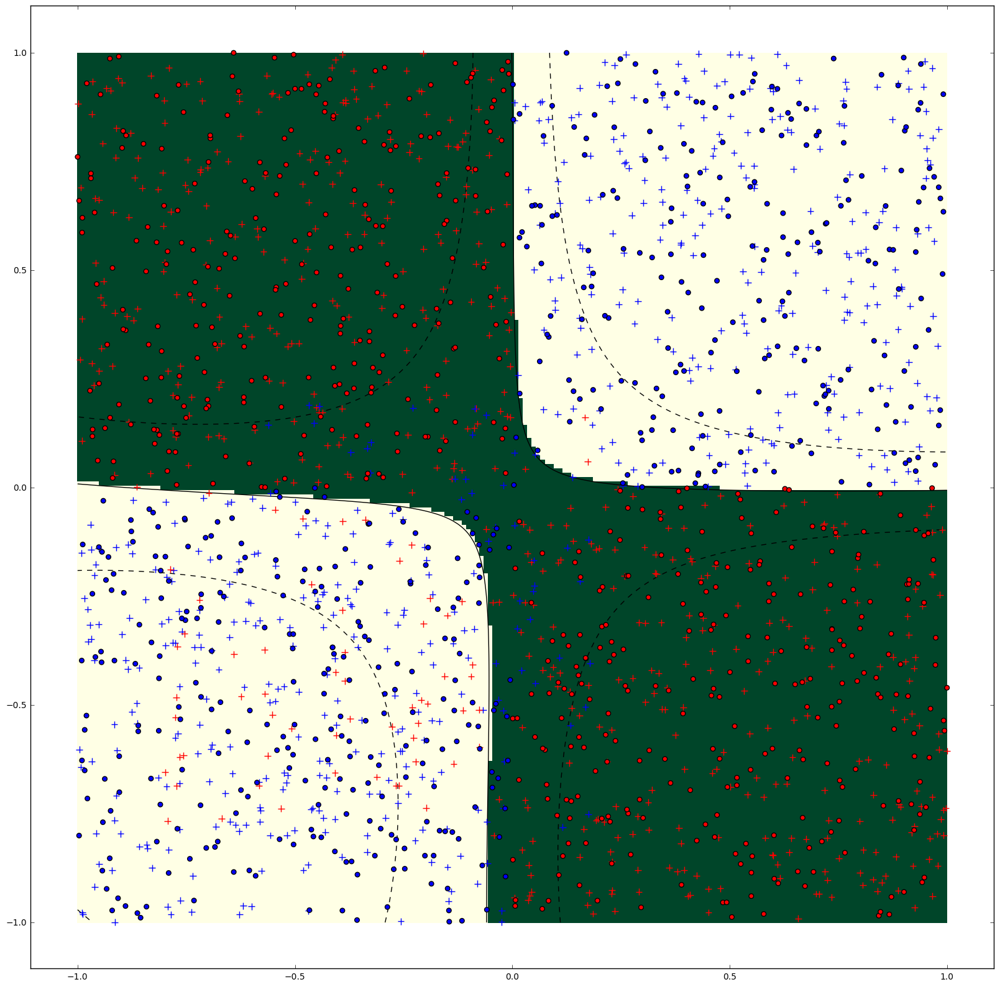



kernel RBF con C = 8.000000
Train Accuracy = 0.902727
Test Accuracy = 0.972000


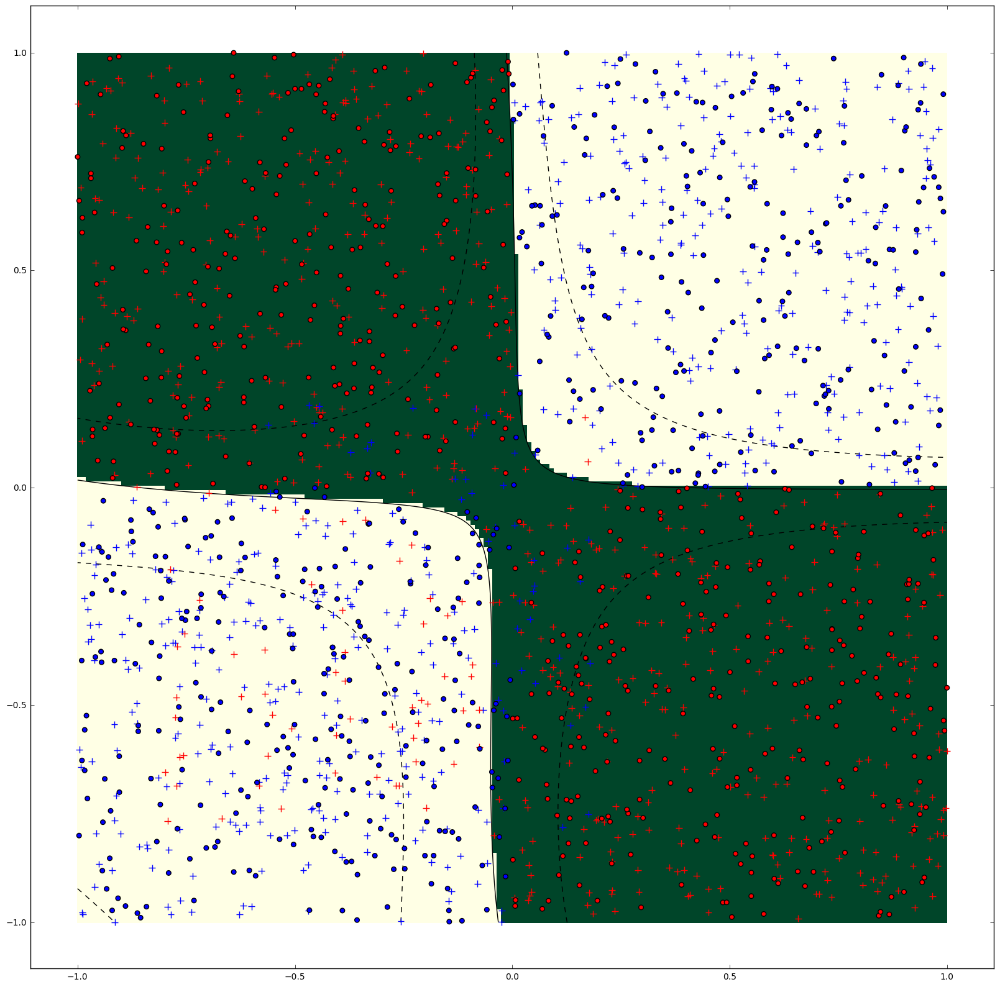



kernel RBF con C = 16.000000
Train Accuracy = 0.898182
Test Accuracy = 0.970000


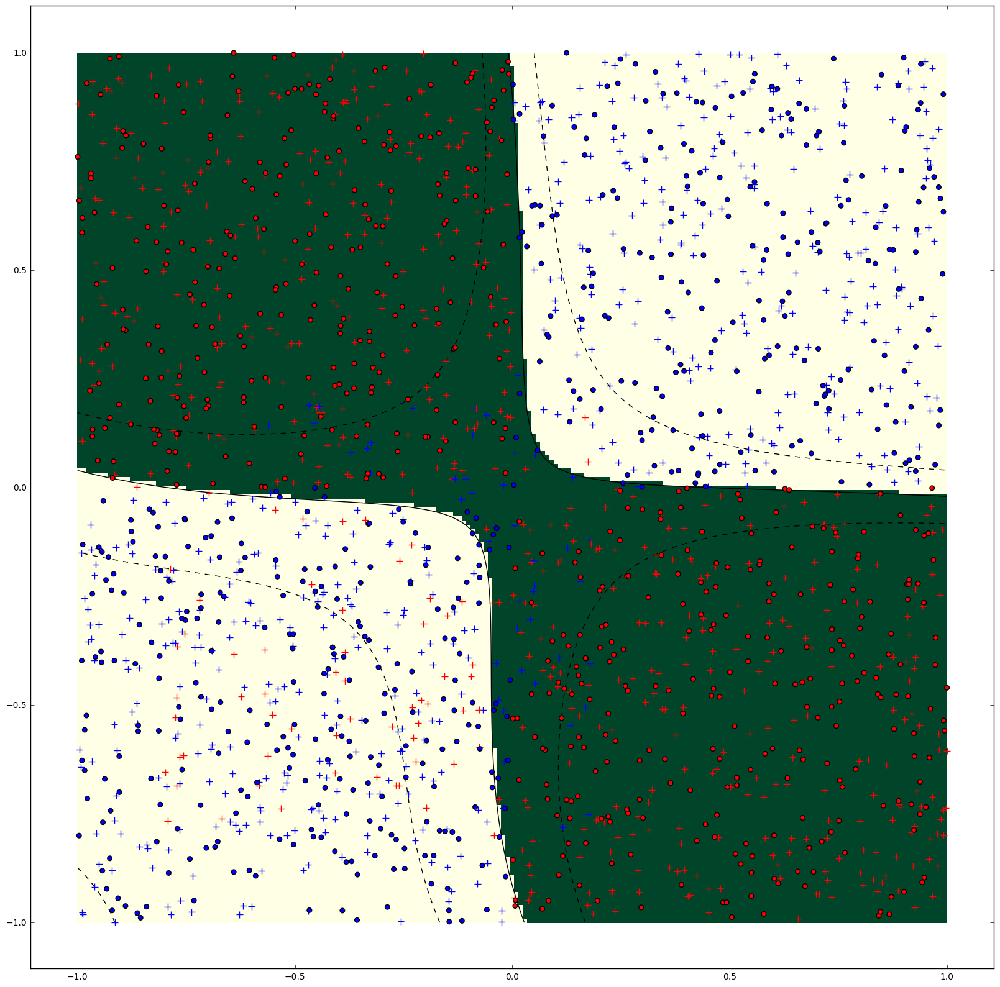

In [15]:
#Utiliazando el kernel RBF

rbf_train = []
rbf_test = []

for k in range(-2,5):
    C = 2**k
    
    clf = SVC(C=C, kernel='rbf')
    clf.fit(X_train, Y_train)
    
    score_train = clf.score(X_train, Y_train)
    score_test = clf.score(X_test, Y_test)
  
    print "kernel RBF con C = %f"%C
    print "Train Accuracy = %f"%score_train
    print "Test Accuracy = %f"%score_test
    
    rbf_train.append(1 - score_train)
    rbf_test.append(1 - score_test)
    
    plot_classifier(clf, X_train, Y_train, X_test, Y_test,'svm')
    print "\n"

kernel Polynomial con C = 0.250000
Train Accuracy = 0.880000
Test Accuracy = 0.935000


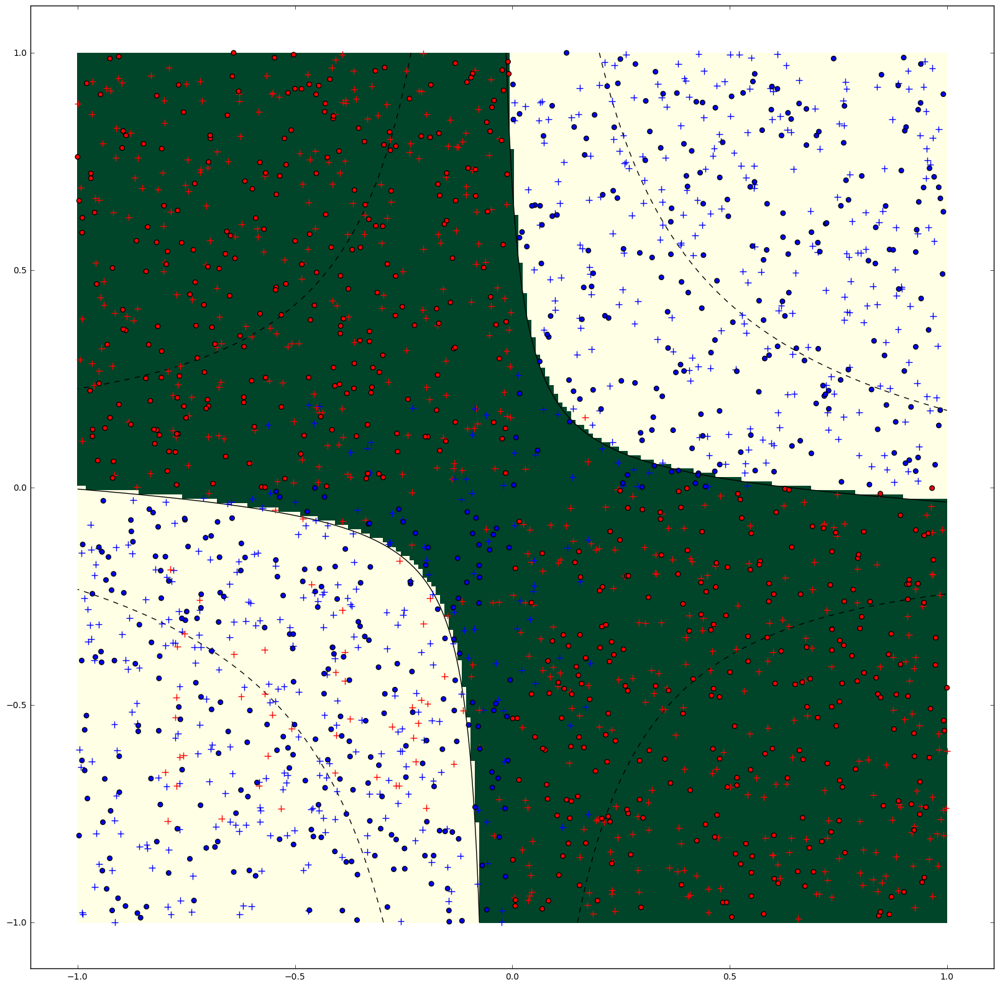



kernel Polynomial con C = 0.500000
Train Accuracy = 0.887273
Test Accuracy = 0.943000


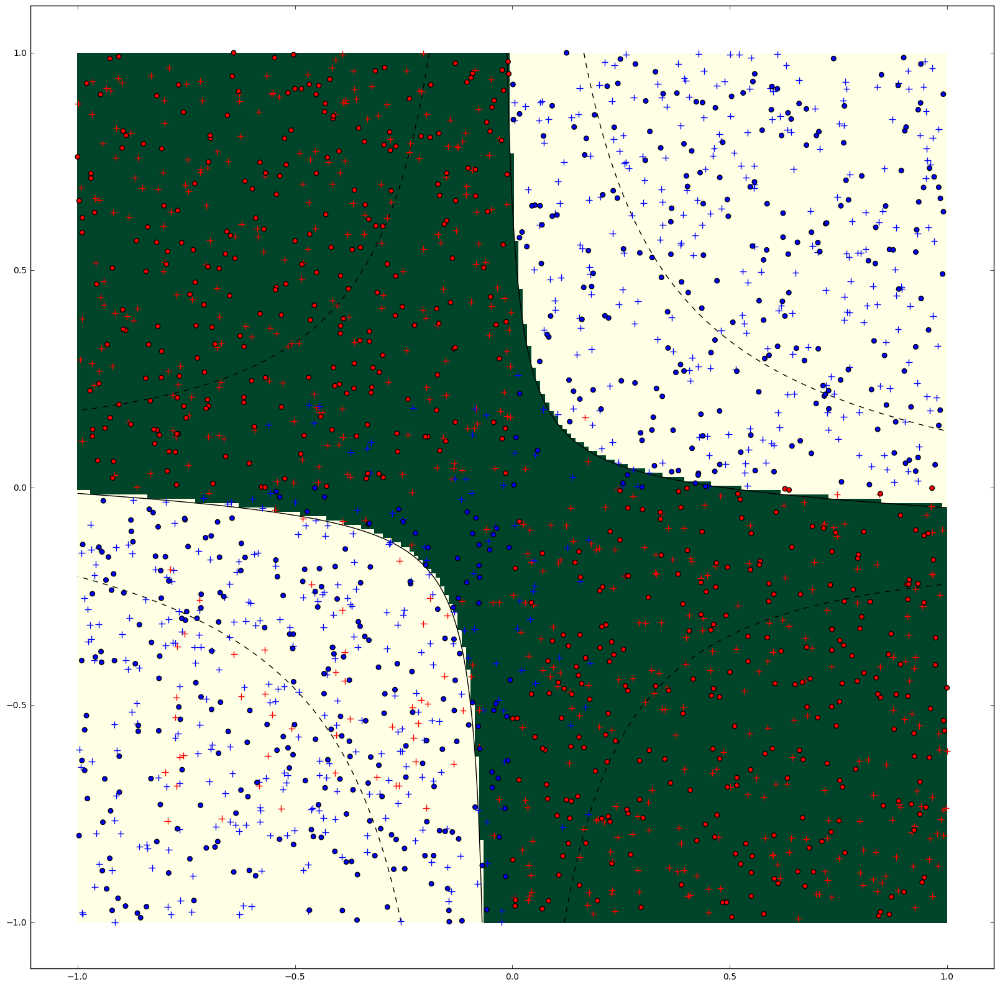



kernel Polynomial con C = 1.000000
Train Accuracy = 0.888182
Test Accuracy = 0.952000


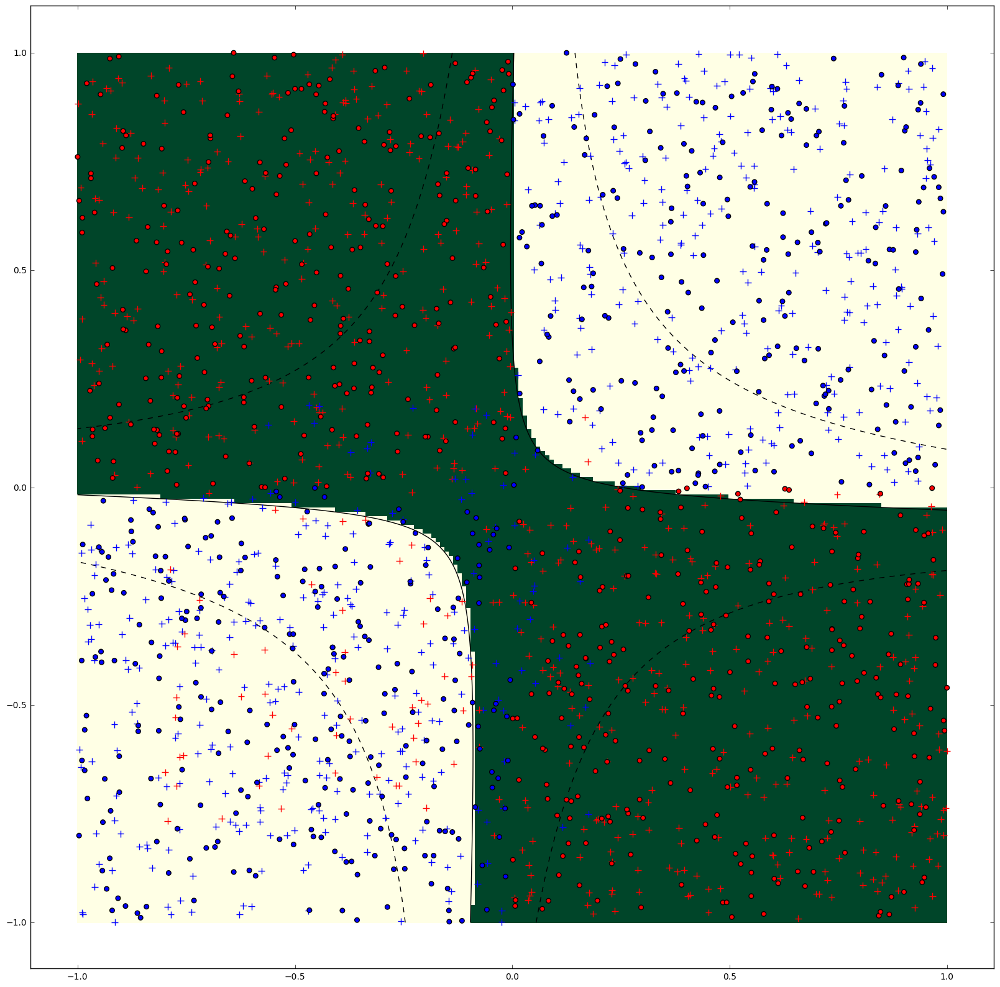



kernel Polynomial con C = 2.000000
Train Accuracy = 0.883636
Test Accuracy = 0.943000


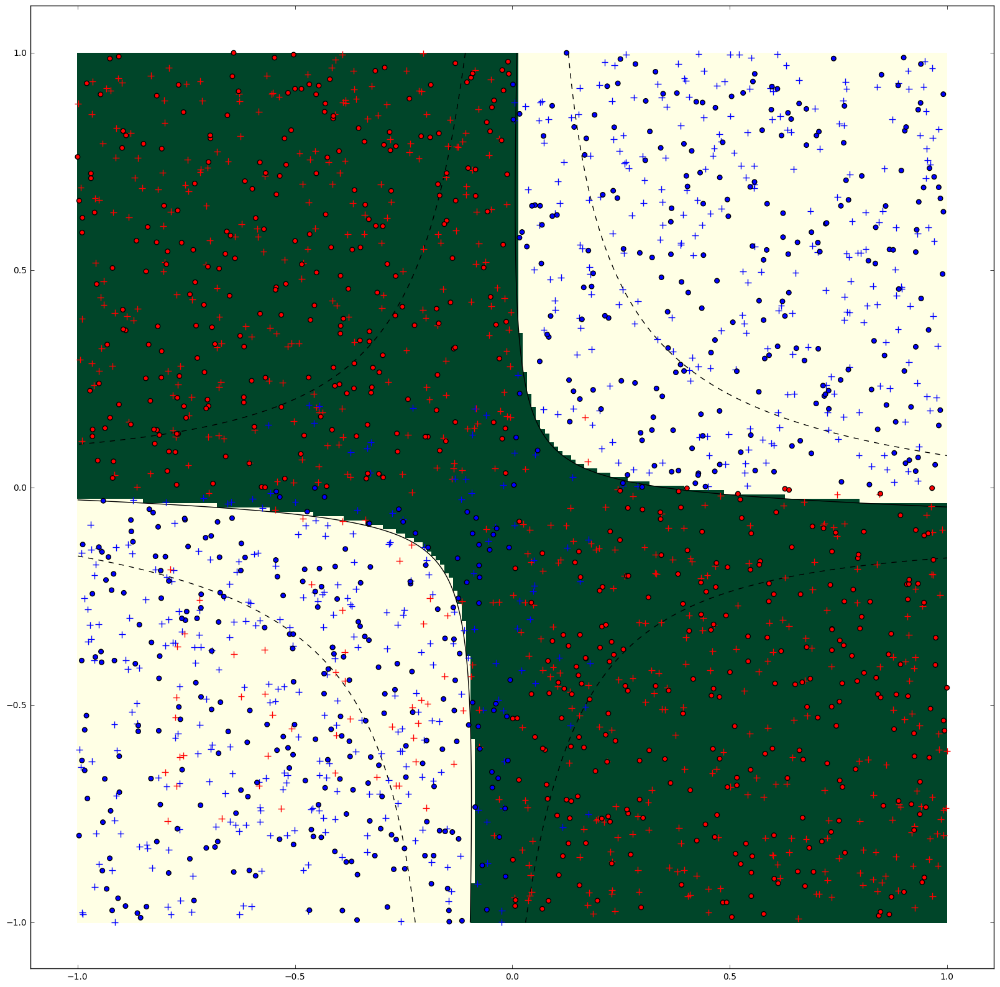



kernel Polynomial con C = 4.000000
Train Accuracy = 0.887273
Test Accuracy = 0.946000


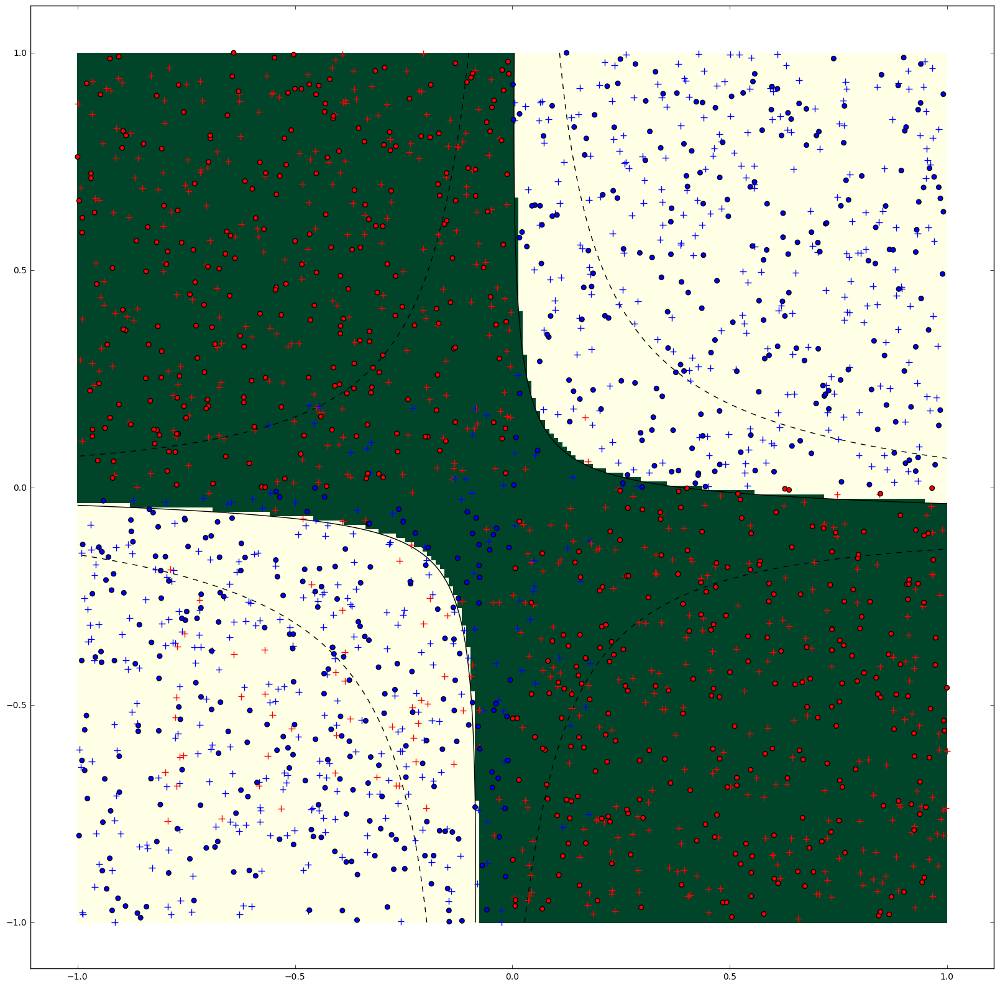



kernel Polynomial con C = 8.000000
Train Accuracy = 0.887273
Test Accuracy = 0.955000


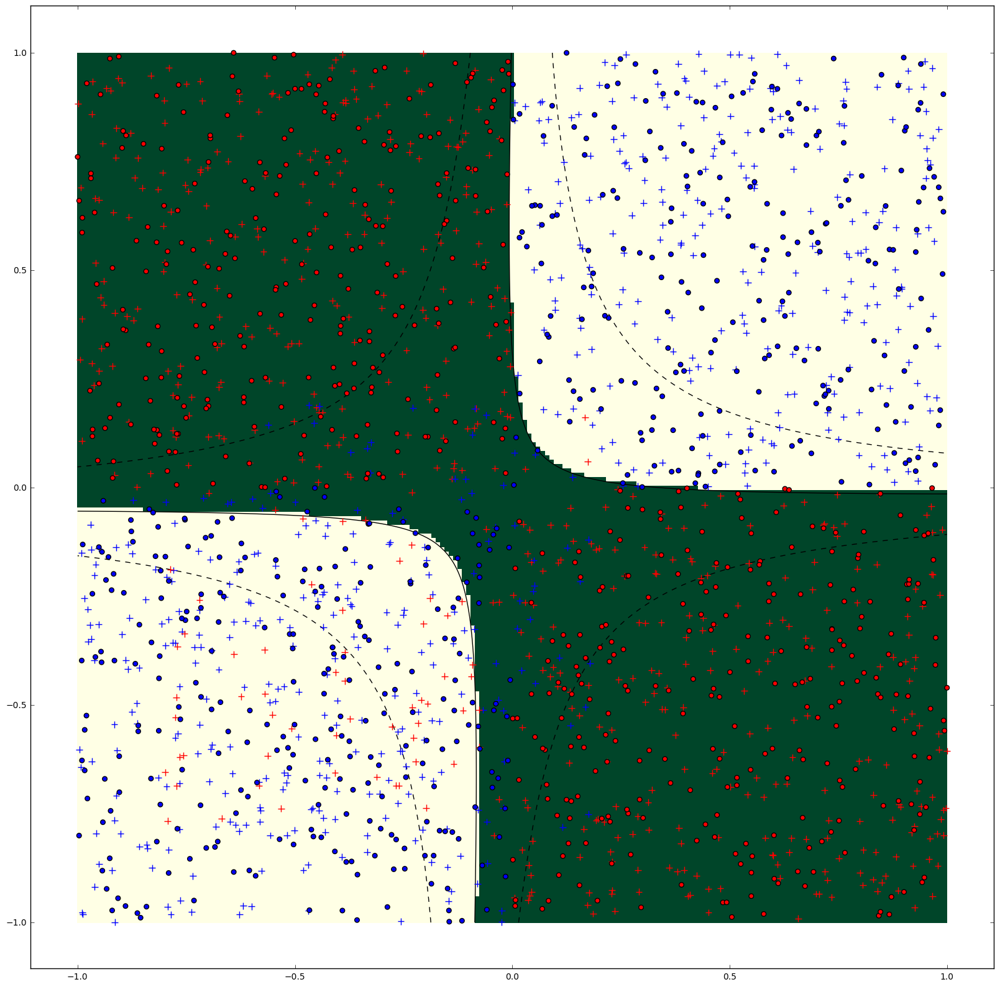



kernel Polynomial con C = 16.000000
Train Accuracy = 0.890000
Test Accuracy = 0.949000


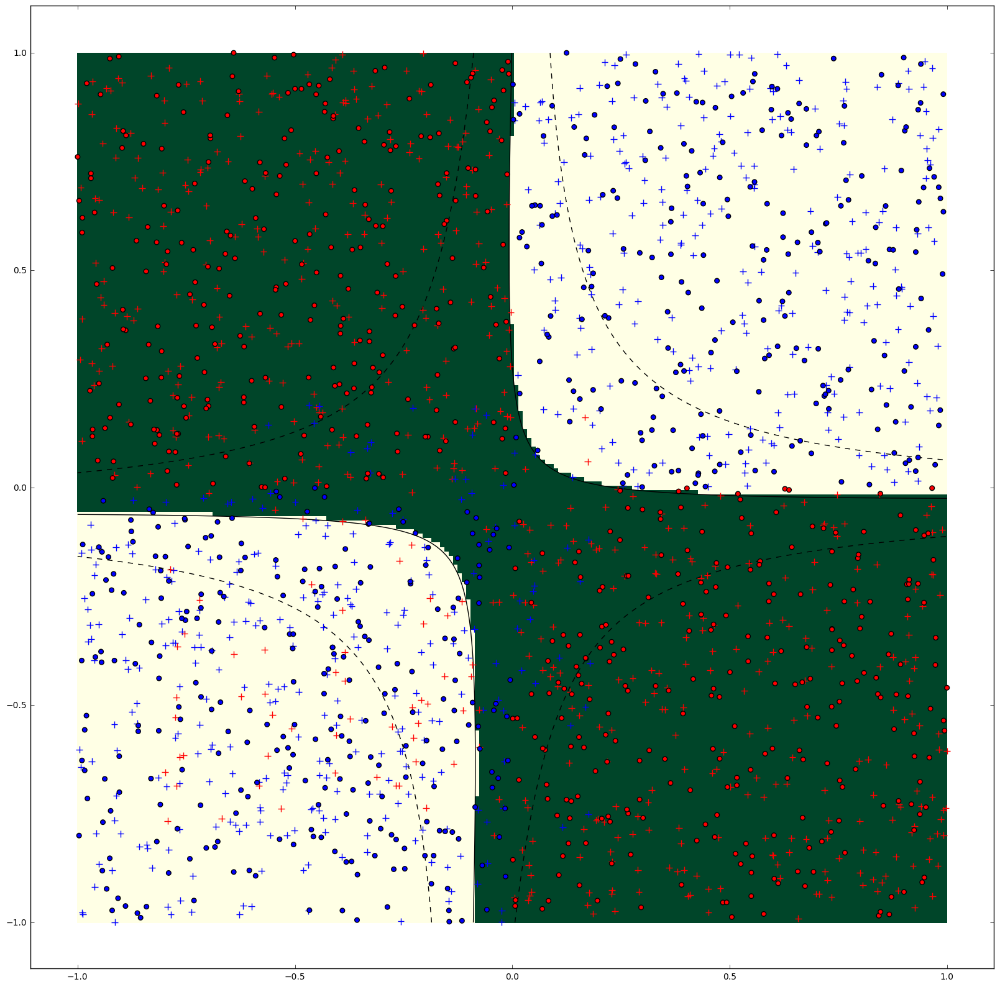

In [16]:
#Utiliazando el kernel Polinomial

poly_train = []
poly_test = []

for k in range(-2,5):
    C = 2**k
    
    clf = SVC(C=C, kernel='poly', degree=2, coef0=1)
    clf.fit(X_train, Y_train)
    
    score_train = clf.score(X_train, Y_train)
    score_test = clf.score(X_test, Y_test)
  
    print "kernel Polynomial con C = %f"%C
    print "Train Accuracy = %f"%score_train
    print "Test Accuracy = %f"%score_test
    
    poly_train.append(1 - score_train)
    poly_test.append(1 - score_test)
    
    plot_classifier(clf, X_train, Y_train, X_test, Y_test,'svm')
    print "\n"

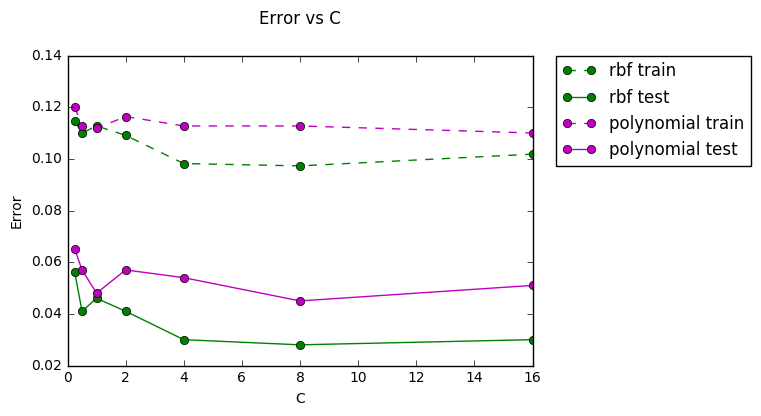

In [17]:
%matplotlib inline
from matplotlib import pyplot as plt

potencias = [2**x for x in range(-2, 5)]

plt.plot(potencias, rbf_train, 'go--', label='rbf train')
plt.plot(potencias, rbf_test, 'go-', label= 'rbf test')
plt.plot(potencias, poly_train, 'mo--', label='polynomial train')
plt.plot(potencias, poly_test, 'mo-', label= 'polynomial test')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs C', y=1.08)
plt.xlabel('C')
plt.ylabel('Error')
plt.show()

En el grafico anterior, podemos observar que en términos globales la *SVM* con el kernel *RBF* posee un mejor comportamiento que el mismo método usando un kernel *Polinomial*, esto debido a que el error tanto del conjunto de entrenamiento como el de prueba es menor para el primer kernel mencionado. Por otra parte, en ambos casos se observa que los errores de testing son menores a los errores de training por lo que podemos determinar que no existe overfiting.

Por ultimo destacar que el valor de $C$ que logra el menor error en ambos casos es $C=8$ en donde la *SVM* con el kernel *RBF* alcanza un *test accuracy* en torno al $97\%$, mientras que el kernel *polinomial* alcanza un *test accuracy* del $95\%$, luego para valores de $C$ superiores el error aumenta levemente.

# Red neuronal artificial

>d) Demuestre **experimentalmente** que una red neuronal artificial correspondiente a 1 sola neurona (i.e.
sin capas escondidas) no puede resolver satisfactoriamente el problema. Puede utilizar la función de
activación y el método de entrenamiento que prefiera. Sea convincente: por ejemplo, intente modificar
los parámetros de la máquina de aprendizaje, reportando métricas que permitan evaluar el desempeño
del modelo en el problema con cada cambio efectuado. Adapte también la función *plot_classifier* para
que represente gráficamente la solución encontrada por la red neuronal. Describa y explique lo que
observa, reportando gráficos de la solución sólo para algunos casos representativos.

Using Theano backend.
WARNING (theano.configdefaults): g++ not detected ! Theano will be unable to execute optimized C-implementations (for both CPU and GPU) and will default to Python implementations. Performance will be severely degraded. To remove this warning, set Theano flags cxx to an empty string.


 960/1000 [===========================>..] - ETA: 0s Neuronas: 1 Train Accuracy: 0.650909  Test Accuracy: 0.656000


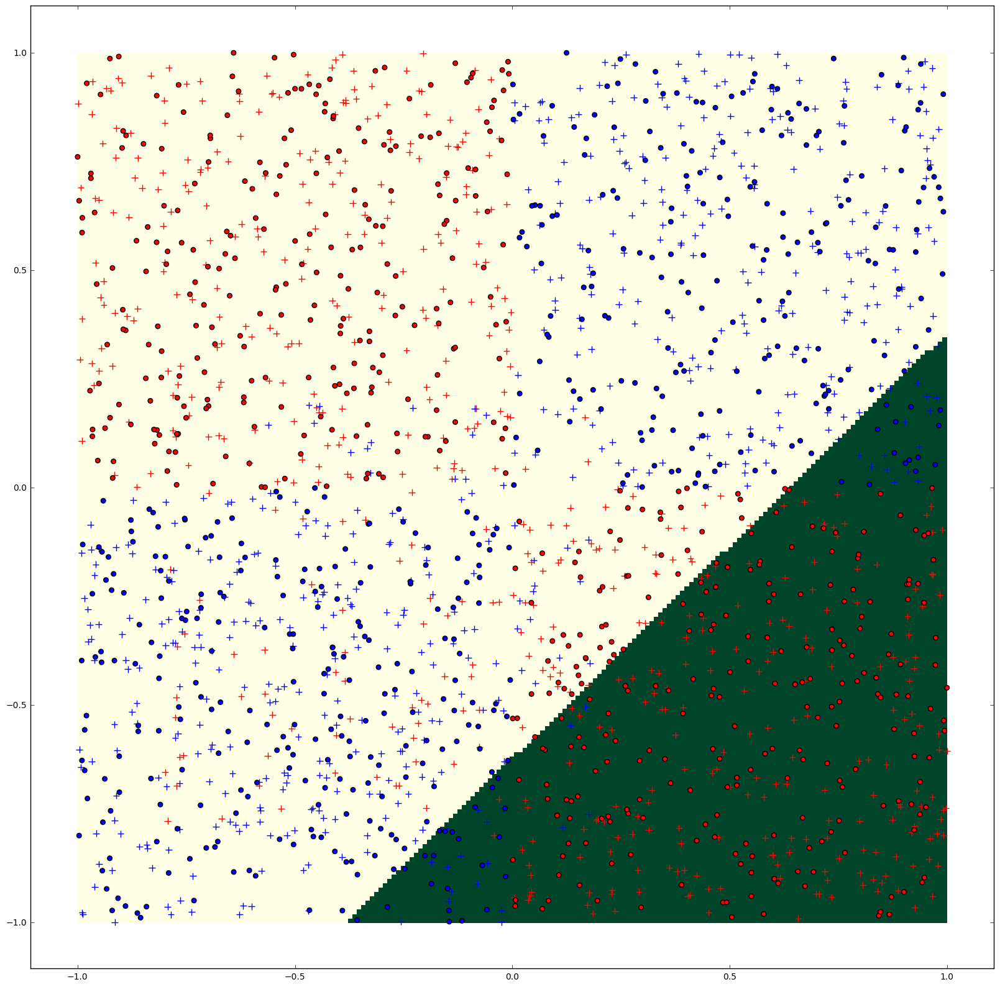

In [18]:
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import SGD

n_h=1
model = Sequential()
model.add(Dense(n_h, input_dim=X_train.shape[1], init='uniform', activation='relu'))
model.add(Dense(1, init='uniform', activation='sigmoid'))
model.compile(optimizer=SGD(lr=1), loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, Y_train, nb_epoch=50, batch_size=100, verbose=0)

scores = model.evaluate(X_train, Y_train)
train_acc = scores[1]
    
scores = model.evaluate(X_test, Y_test)
test_acc = scores[1]

print " Neuronas: %d Train Accuracy: %f  Test Accuracy: %f" % (n_h, train_acc, test_acc)

plot_classifier(model, X_train, Y_train, X_test, Y_test, 'ann')

>e) Demuestre **experimentalmente** que una red neuronal artificial con 1 capa escondida puede resolver satisfactoriamente el problema obtenido en (a). Puede utilizar la arquitectura y el método de entrenamiento
que prefiera, pero en esta actividad puede optar tranquilamente por usar los hiper-parámetros que se
entregan como referencia en el código de ejemplo. Cambie el número de neuronas $N_h$ en la red entre 2
y 32 en potencias de 2, graficando el error de entrenamiento y pruebas como función de $N_h$. Describa
y explique lo que observa. Utilice la función *plot_classifier*, diseñada anteriormente, para construir
gráficos de la solución en algunos casos representativos.

In [19]:
ann_error_train = []
ann_error_test = []

for k in range(1,6):
    
    n_h = 2**k
    
    model = Sequential()
    model.add(Dense(n_h, input_dim=X_train.shape[1], init='uniform', activation='relu'))
    model.add(Dense(1, init='uniform', activation='sigmoid'))
    model.compile(optimizer=SGD(lr=1), loss='binary_crossentropy', metrics=['accuracy'])
    model.fit(X_train, Y_train, nb_epoch=50, batch_size=100, verbose=0)
    
    scores = model.evaluate(X_train, Y_train)
    train_acc = scores[1]
    
    scores = model.evaluate(X_test, Y_test)
    test_acc = scores[1]

    print " Neurons: %d Train Accuracy: %f  Test Accuracy: %f" % (n_h, train_acc, test_acc)
    
    ann_error_train.append(1 - train_acc)
    ann_error_test.append(1 - test_acc)

1000/1000 [==============================] - 0s     
 Neurons: 2 Train Accuracy: 0.719091  Test Accuracy: 0.712000
1000/1000 [==============================] - 0s     
 Neurons: 32 Train Accuracy: 0.884545  Test Accuracy: 0.957000


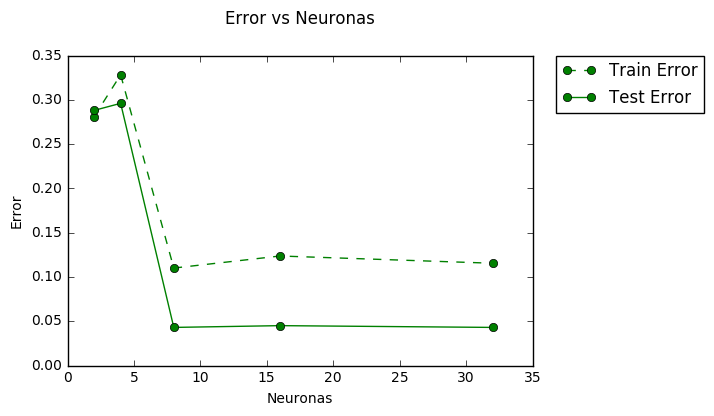

In [20]:
potencias = [2**x for x in range(1, 6)]

plt.plot(potencias, ann_error_train, 'go--', label='Train Error')
plt.plot(potencias, ann_error_test, 'go-', label= 'Test Error')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs Neuronas', y=1.08)
plt.xlabel('Neuronas')
plt.ylabel('Error')
plt.show()

En el grafico anterior observamos que la precisión aumenta a medida que aumenta el número de neuronas, hasta alcanzar su máximo con $32$ neuronas. Para $8$ neuronas vemos una ligera pérdida de precisión, que luego se recupera al utilizar $16$ neuronas.

A continuación presentamos los $3$ casos más representativos, para $2$, $8$ y $32$ neuronas respectivamente. 

 992/1000 [============================>.] - ETA: 0s Neuronas: 2 Train Accuracy: 0.710000  Test Accuracy: 0.705000


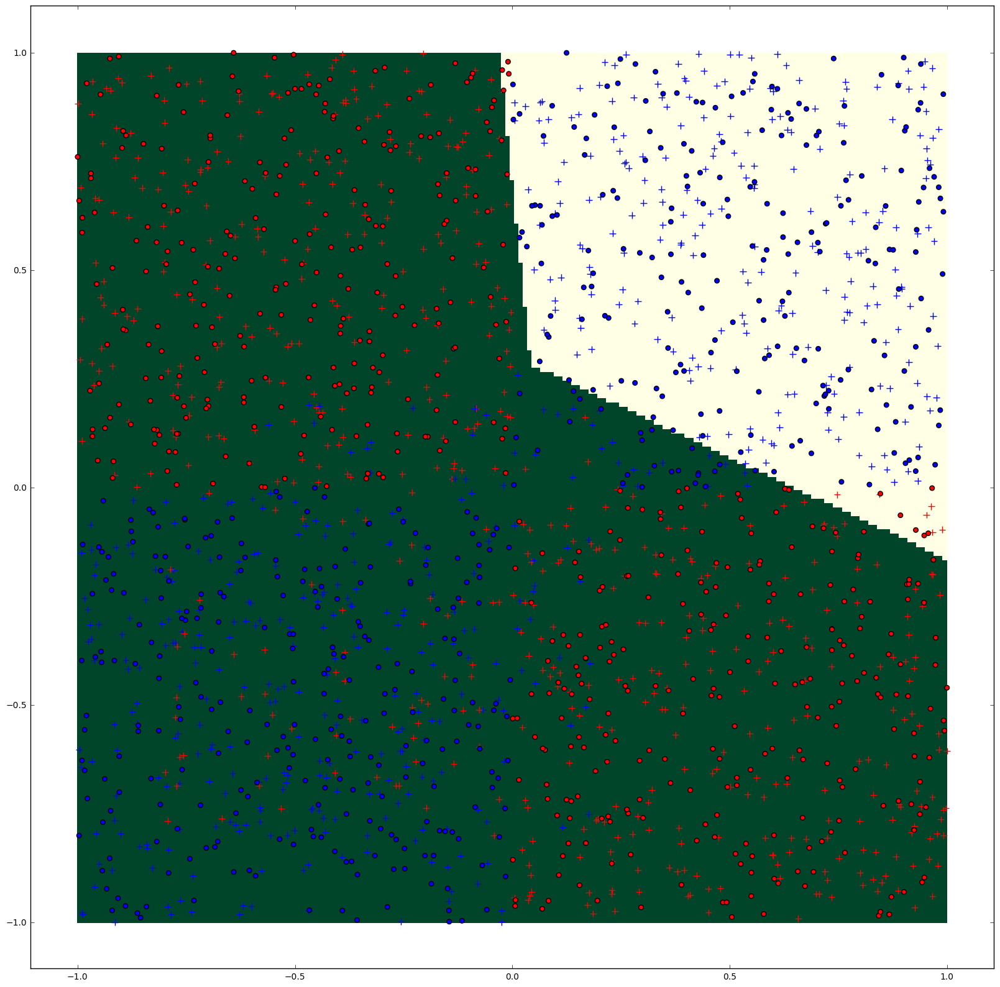

 992/1000 [============================>.] - ETA: 0s Neuronas: 8 Train Accuracy: 0.890909  Test Accuracy: 0.965000


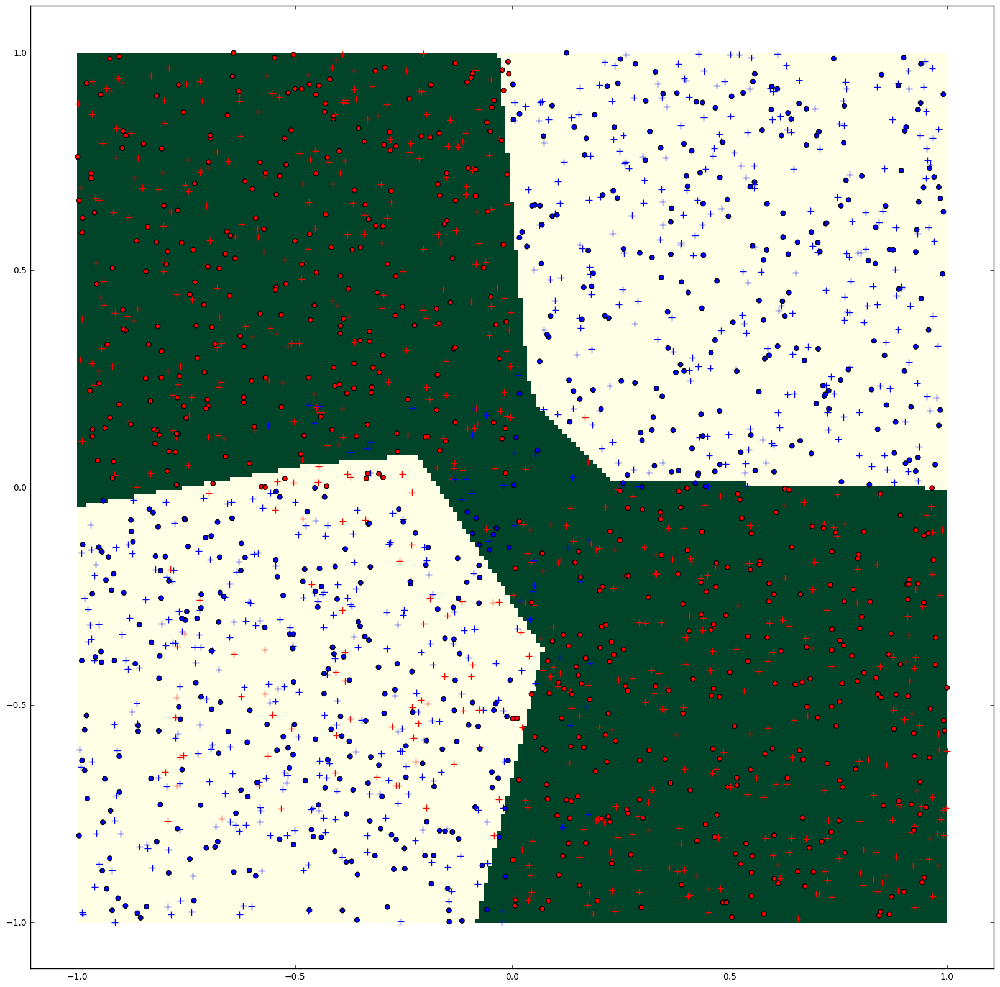

1000/1000 [==============================] - 0s     
 Neuronas: 32 Train Accuracy: 0.894545  Test Accuracy: 0.965000


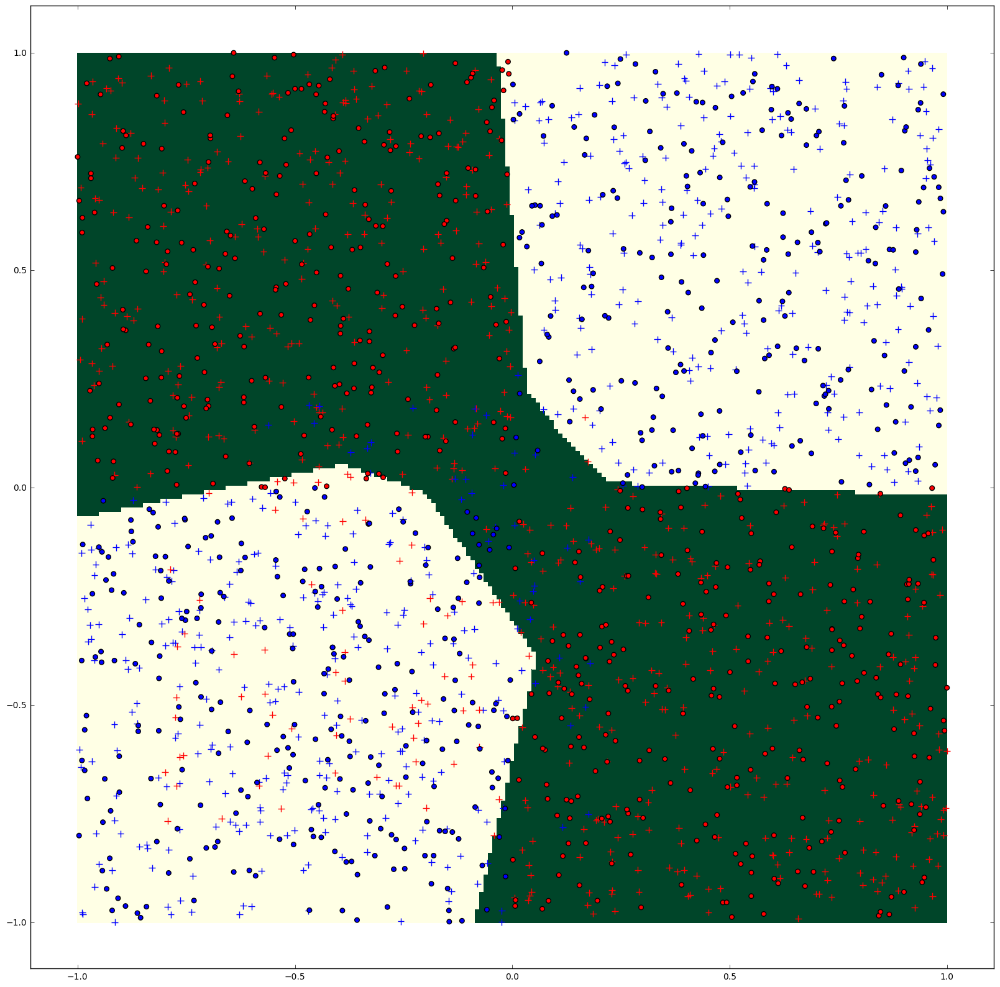

In [21]:
for n_h in [2, 8, 32]:

    model = Sequential()
    model.add(Dense(n_h, input_dim=X_train.shape[1], init='uniform', activation='relu'))
    model.add(Dense(1, init='uniform', activation='sigmoid'))
    model.compile(optimizer=SGD(lr=1), loss='binary_crossentropy', metrics=['accuracy'])
    model.fit(X_train, Y_train, nb_epoch=50, batch_size=100, verbose=0)

    scores = model.evaluate(X_train, Y_train)
    train_acc = scores[1]

    scores = model.evaluate(X_test, Y_test)
    test_acc = scores[1]

    print " Neuronas: %d Train Accuracy: %f  Test Accuracy: %f" % (n_h, train_acc, test_acc)
    plot_classifier(model, X_train, Y_train, X_test, Y_test, 'ann')

# Árboles de clasificación

>f) Demuestre **experimentalmente** que stump (árbol de clasificación de 1 nivel) no puede resolver satisfactoriamente
el problema anterior. Puede utilizar el criterio y la función de partición que prefiera. Sea convincente: por ejemplo, intente modificar los parámetros de la máquina, reportando métricas que permitan evaluar el desempeño del modelo en el problema con cada cambio efectuado. Adapte también la función *plot_classifier* para que represente gráficamente la solución encontrada por el árbol. Describa y explique lo que observa, reportando gráficos de la solución sólo para algunos casos representativos.

In [22]:
from sklearn.tree import DecisionTreeClassifier as Tree

clf=Tree(criterion='gini', splitter='best', random_state=0, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Gini | Splitter = Best | Random State = False ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

clf=Tree(criterion='entropy', splitter='best', random_state=0, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Entropy | Splitter = Best | Random State = False ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

print "\n"

clf=Tree(criterion='gini', splitter='random', random_state=0, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Gini | Splitter = random | Random State = False ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

clf=Tree(criterion='entropy', splitter='random', random_state=0, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Entropy | Splitter = random | Random State = False ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

print "\n"

clf=Tree(criterion='gini', splitter='best', random_state=1, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Gini | Splitter = Best | Random State = True ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

clf=Tree(criterion='entropy', splitter='best', random_state=1, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Entropy | Splitter = Best | Random State = True ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

print "\n"

clf=Tree(criterion='gini', splitter='random', random_state=1, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Gini | Splitter = random | Random State = True ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

clf=Tree(criterion='entropy', splitter='random', random_state=1, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Entropy | Splitter = random | Random State = True ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)


Criterion = Gini | Splitter = Best | Random State = False ---> Train Acc = 0.541818  Test Acc = 0.489000
Criterion = Entropy | Splitter = Best | Random State = False ---> Train Acc = 0.508182  Test Acc = 0.486000


Criterion = Gini | Splitter = random | Random State = False ---> Train Acc = 0.507273  Test Acc = 0.491000
Criterion = Entropy | Splitter = random | Random State = False ---> Train Acc = 0.507273  Test Acc = 0.491000


Criterion = Gini | Splitter = Best | Random State = True ---> Train Acc = 0.541818  Test Acc = 0.489000
Criterion = Entropy | Splitter = Best | Random State = True ---> Train Acc = 0.508182  Test Acc = 0.486000


Criterion = Gini | Splitter = random | Random State = True ---> Train Acc = 0.510909  Test Acc = 0.498000
Criterion = Entropy | Splitter = random | Random State = True ---> Train Acc = 0.510909  Test Acc = 0.498000


Ahora graficaremos los $3$ casos con el mejor *test accuracy*. 

Criterion = Gini | Splitter = random | Random State = True ---> Train Acc = 0.510909  Test Acc = 0.498000


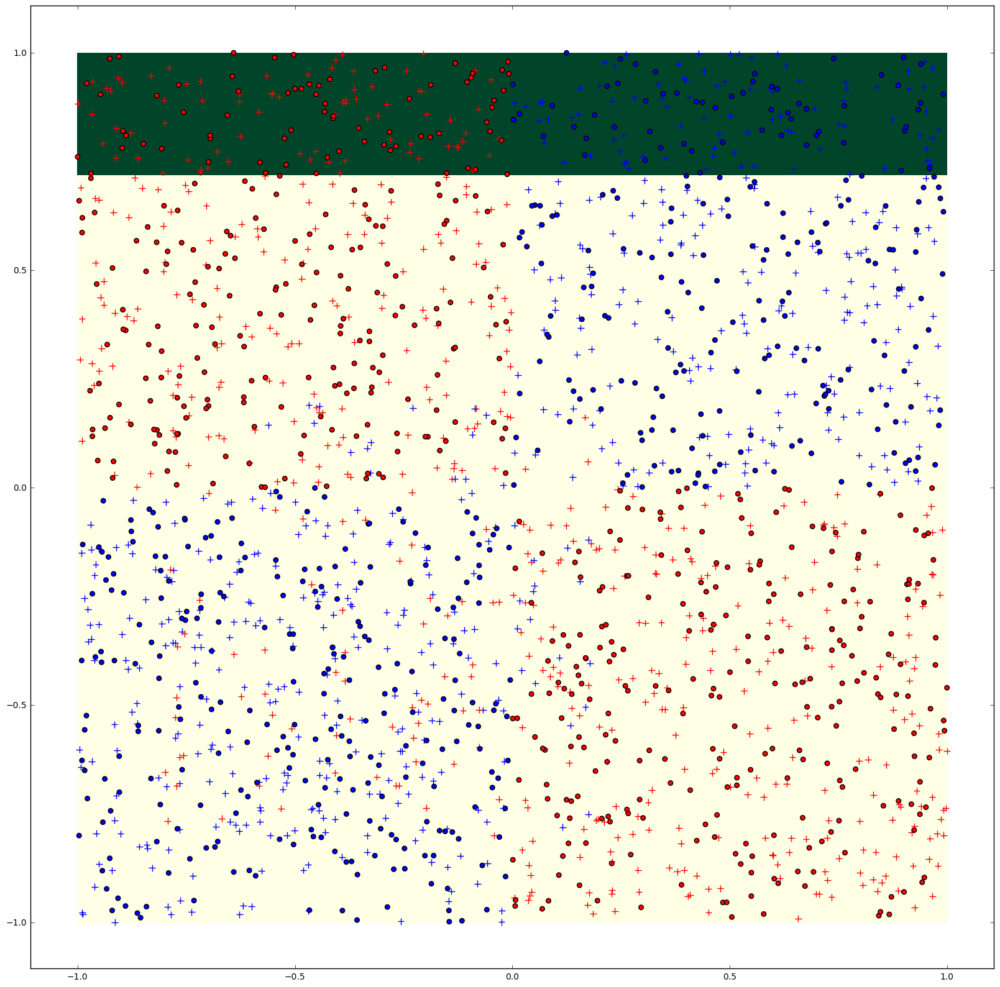

In [23]:
clf=Tree(criterion='gini', splitter='random', random_state=1, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Gini | Splitter = random | Random State = True ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')

Criterion = Entropy | Splitter = random | Random State = False ---> Train Acc = 0.507273  Test Acc = 0.491000


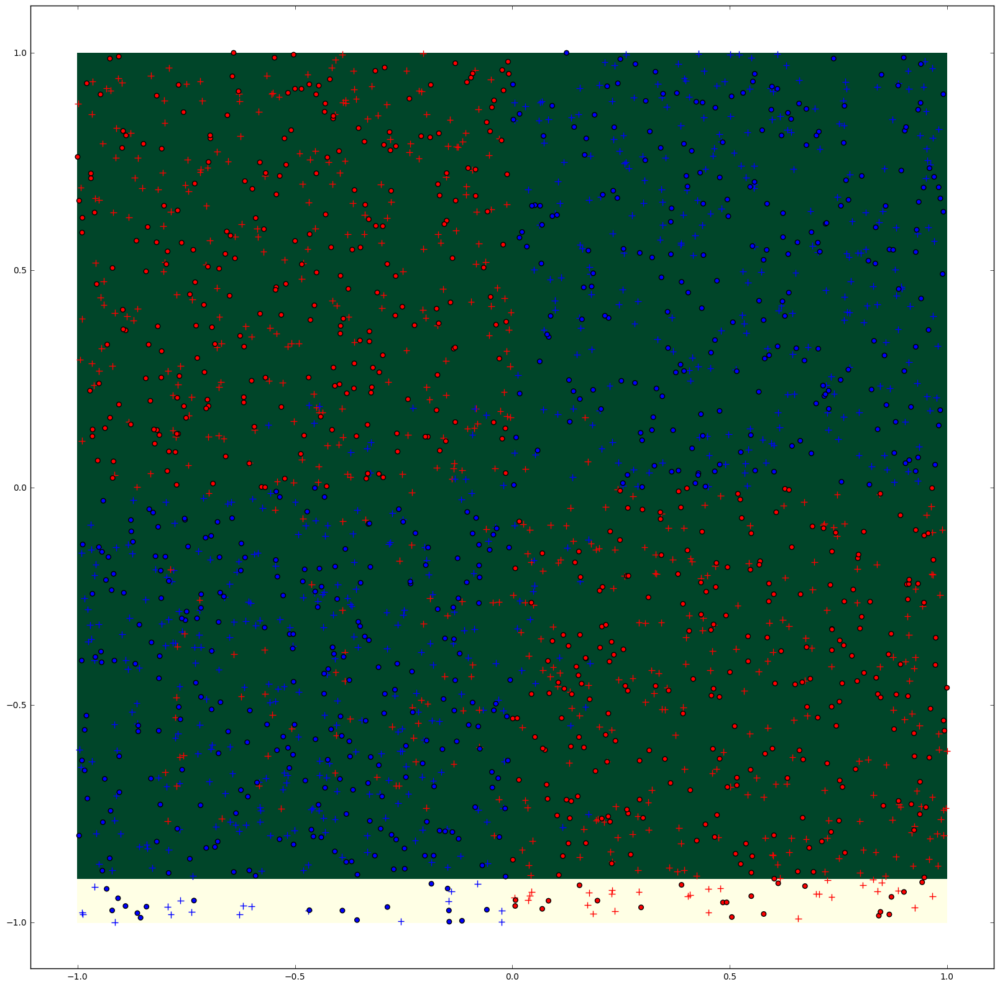

In [24]:
clf=Tree(criterion='entropy', splitter='random', random_state=0, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Entropy | Splitter = random | Random State = False ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')

Criterion = Gini | Splitter = Best | Random State = False ---> Train Acc = 0.541818  Test Acc = 0.489000


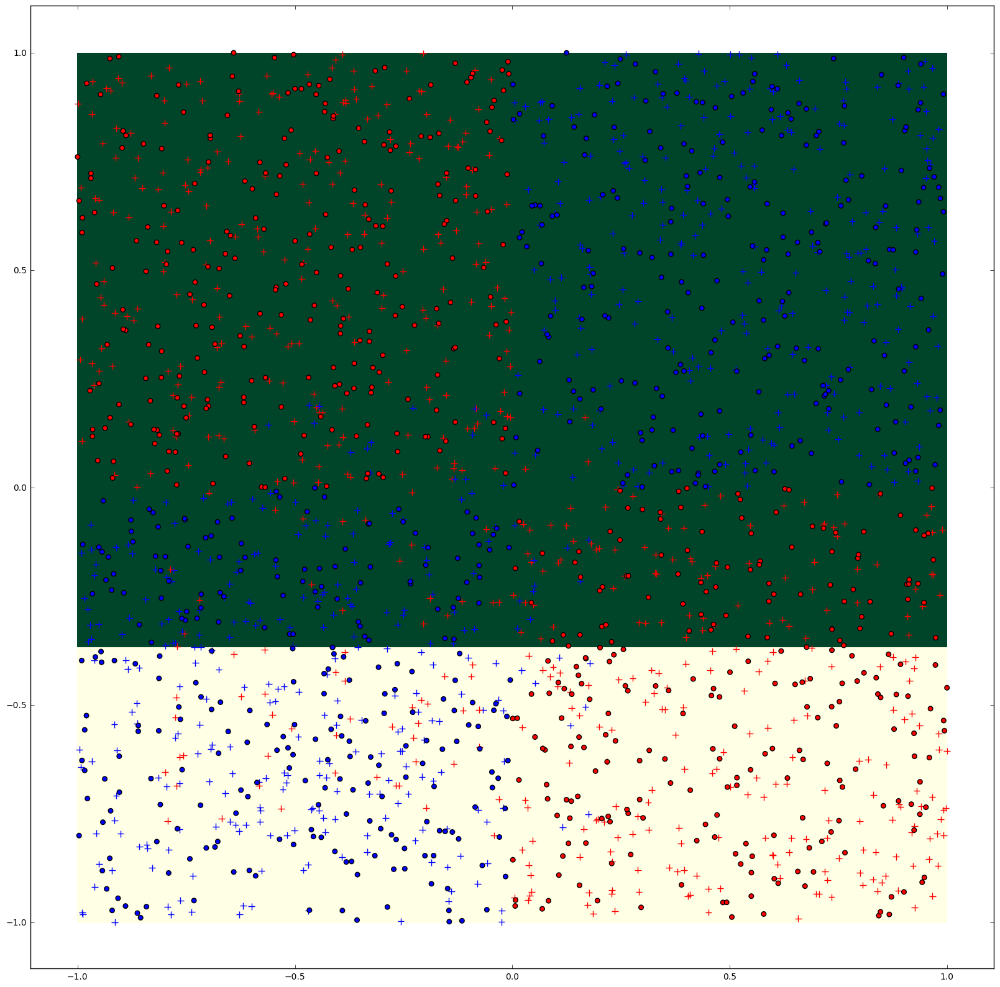

In [25]:
clf=Tree(criterion='gini', splitter='best', random_state=0, max_depth=1)
clf.fit(X_train,Y_train)
acc_train = clf.score(X_train, Y_train)
acc_test = clf.score(X_test, Y_test)

print "Criterion = Gini | Splitter = Best | Random State = False ---> Train Acc = %f  Test Acc = %f"%(acc_train, acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')

Por lo tanto, de los gráficos anteriores observamos que, para un árbol de clasificación de un nivel, no es posible resolver este problema, sin importar los parámetros que se utilicen ya que estos no afectan mucho la precisión. 

>g) Demuestre **experimentalmente** que un árbol de clasificación de múltiples niveles puede resolver satisfactoriamente el problema estudiado. Puede utilizar el criterio y la función de partición que prefiera, pero puede optar tranquilamente por usar los hiper-parámetros que se entregan como referencia en el código de ejemplo. Cambie el número de niveles admitidos en el árbol $Nt$ entre $2$ y $20$, graficando el error de entrenamiento y pruebas como función de $Nt$. Describa y explique lo que observa. Utilice la función *plot_classifier*, diseñada anteriormente, para construir gráficos de la solución en algunos casos representativos.

### Árbol de clasificación con criterio Gini 

In [91]:
tree_train = []
tree_test = []

print "Multiples Niveles | Criterion = Gini | Splitter = Best"
print "---------------------------------------------------------"

for n_t in range(2, 21):
    
    clf=Tree(criterion='gini', splitter='best', random_state=0, max_depth=n_t)
    clf.fit(X_train, Y_train)
    
    print "\nDepth %d"%clf.tree_.max_depth
    
    acc_train = clf.score(X_train, Y_train)
    print "Train Accuracy = %f"%acc_train
    tree_train.append(1 - acc_train)
    
    acc_test = clf.score(X_test, Y_test)
    print "Test Accuracy = %f"%acc_test
    tree_test.append(1 - acc_test)
        
    print "--------------------------------------"

Multiples Niveles | Criterion = Gini | Splitter = Best
---------------------------------------------------------

Depth 2
Train Accuracy = 0.763636
Test Accuracy = 0.798000
--------------------------------------

Depth 3
Train Accuracy = 0.909091
Test Accuracy = 0.990000
--------------------------------------

Depth 4
Train Accuracy = 0.911818
Test Accuracy = 0.989000
--------------------------------------

Depth 5
Train Accuracy = 0.923636
Test Accuracy = 0.980000
--------------------------------------

Depth 6
Train Accuracy = 0.929091
Test Accuracy = 0.975000
--------------------------------------

Depth 7
Train Accuracy = 0.934545
Test Accuracy = 0.968000
--------------------------------------

Depth 8
Train Accuracy = 0.943636
Test Accuracy = 0.961000
--------------------------------------

Depth 9
Train Accuracy = 0.952727
Test Accuracy = 0.949000
--------------------------------------

Depth 10
Train Accuracy = 0.962727
Test Accuracy = 0.942000
----------------------------------

A continuacion graficamos el *error* en funcion de la cantidad de *niveles*.

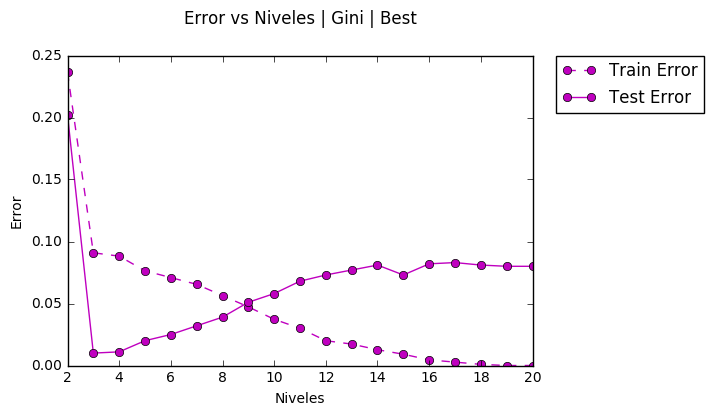

In [92]:
plt.plot(range(2, 21), tree_train, 'mo--', label='Train Error')
plt.plot(range(2, 21), tree_test, 'mo-', label= 'Test Error')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs Niveles | Gini | Best', y=1.08)
plt.xlabel('Niveles')
plt.ylabel('Error')
plt.show()

En el grafico anterior observamos que con $3$ niveles se alcanza el mayor *Accuracy* de *Testing*, a medida que aumentamos el número de *niveles* observamos como el modelo empieza a sobre ajustarse, siendo el punto crítico la clasificación con $9$ niveles en donde ambos errores, el de prueba y el de entrenamiento se igualan. Para arboles con niveles mayores a $9$ vemos como el error de entrenamiento disminuye y el de prueba aumenta, hasta estabilizarse al alcanzar los $19$ niveles donde el error de entrenamiento llega a $0$ y el de testing llega a $0.08$, valores que ya no se verán modificados sin importar cuantos niveles se agreguen, estando el modelo completamente sobre ajustado. 

A continuación, el grafico de los casos más significativos.


Depth 3
Train Accuracy = 0.909091
Test Accuracy = 0.990000


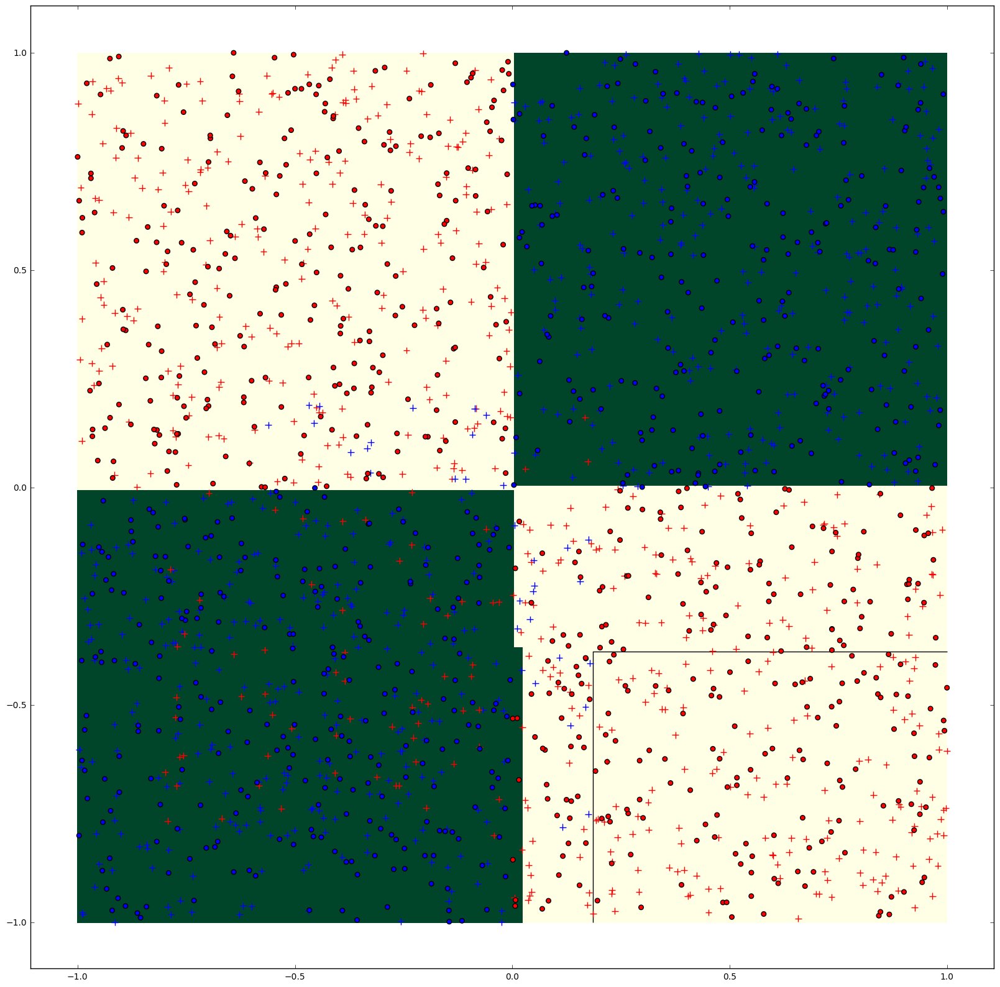

In [115]:
clf = Tree(criterion='gini', splitter='best', random_state=0, max_depth=3)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')


Depth 9
Train Accuracy = 0.952727
Test Accuracy = 0.949000


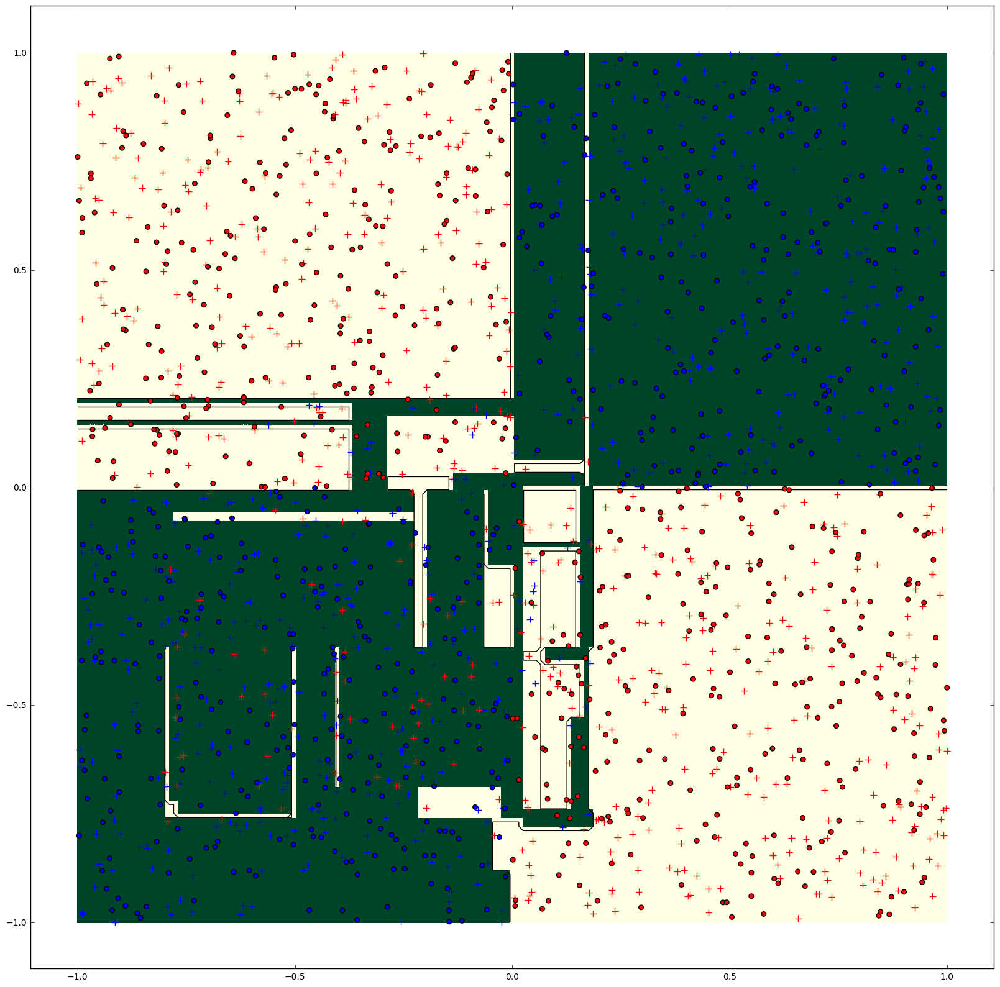

In [116]:
clf = Tree(criterion='gini', splitter='best', random_state=0, max_depth=9)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')


Depth 19
Train Accuracy = 0.993636
Test Accuracy = 0.925000


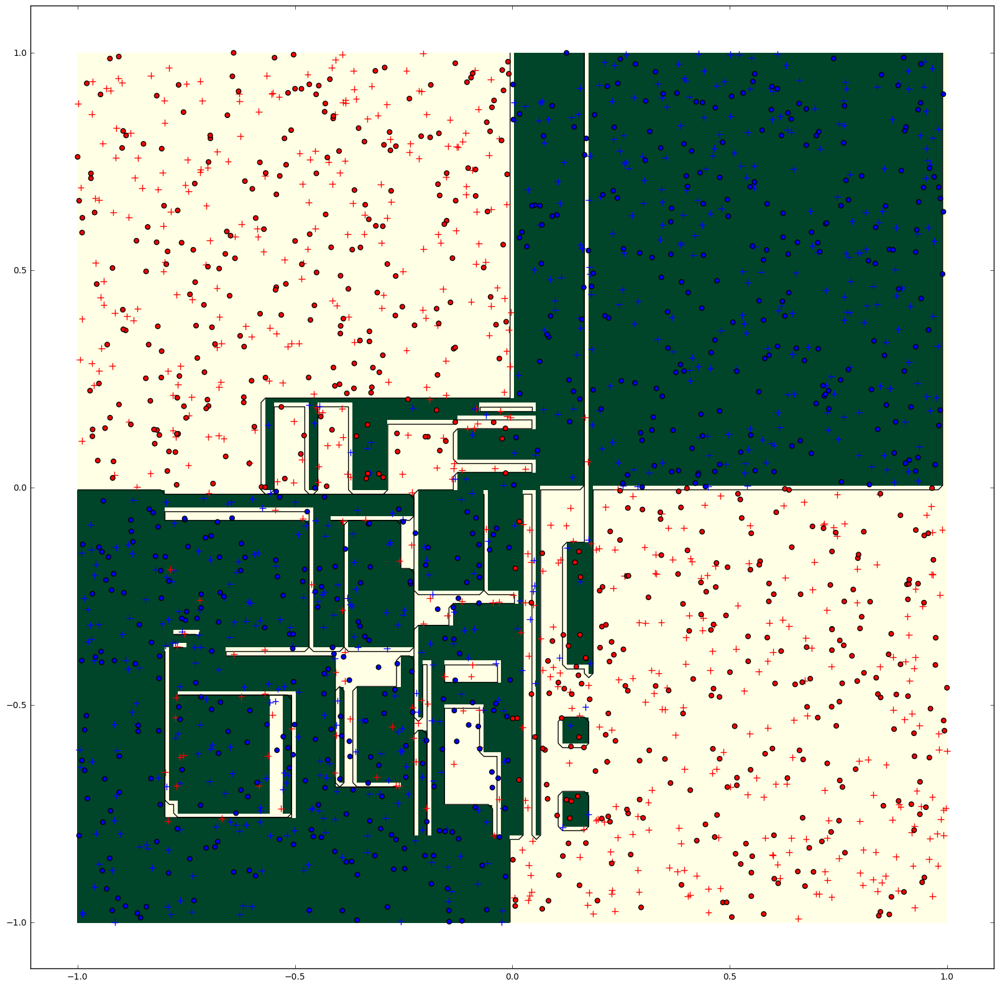

In [117]:
clf = Tree(criterion='entropy', splitter='best', random_state=0, max_depth=19)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')

Ahora usaremos el mismo criterio pero usando como splitter *Random*. 

In [93]:
tree_train2 = []
tree_test2 = []

print "Multiples Niveles | Criterion = Gini | Splitter = Random"
print "---------------------------------------------------------"

for n_t in range(2, 21):
    
    clf=Tree(criterion='gini', splitter='random', random_state=0, max_depth=n_t)
    clf.fit(X_train, Y_train)
    
    print "\nDepth %d"%clf.tree_.max_depth
    
    acc_train = clf.score(X_train, Y_train)
    print "Train Accuracy = %f"%acc_train
    tree_train2.append(1 - acc_train)
    
    acc_test = clf.score(X_test, Y_test)
    print "Test Accuracy = %f"%acc_test
    tree_test2.append(1 - acc_test)
        
    print("--------------------------------------")

Multiples Niveles | Criterion = Gini | Splitter = Random
---------------------------------------------------------

Depth 2
Train Accuracy = 0.535455
Test Accuracy = 0.514000
--------------------------------------

Depth 3
Train Accuracy = 0.778182
Test Accuracy = 0.793000
--------------------------------------

Depth 4
Train Accuracy = 0.616364
Test Accuracy = 0.629000
--------------------------------------

Depth 5
Train Accuracy = 0.583636
Test Accuracy = 0.581000
--------------------------------------

Depth 6
Train Accuracy = 0.746364
Test Accuracy = 0.761000
--------------------------------------

Depth 7
Train Accuracy = 0.843636
Test Accuracy = 0.880000
--------------------------------------

Depth 8
Train Accuracy = 0.885455
Test Accuracy = 0.944000
--------------------------------------

Depth 9
Train Accuracy = 0.828182
Test Accuracy = 0.871000
--------------------------------------

Depth 10
Train Accuracy = 0.889091
Test Accuracy = 0.934000
--------------------------------

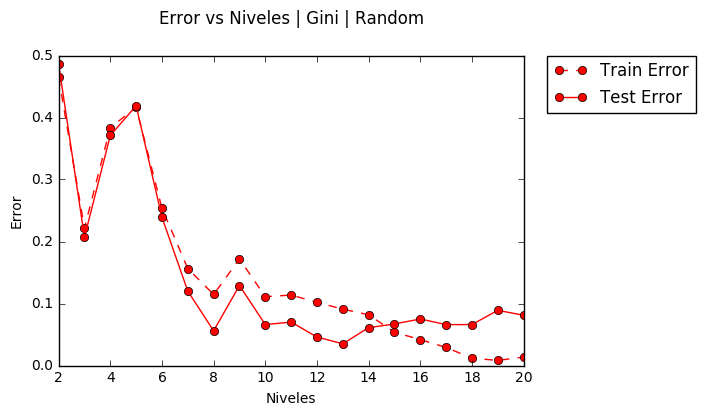

In [94]:
plt.plot(range(2, 21), tree_train2, 'ro--', label='Train Error')
plt.plot(range(2, 21), tree_test2, 'ro-', label= 'Test Error')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs Niveles | Gini | Random', y=1.08)
plt.xlabel('Niveles')
plt.ylabel('Error')
plt.show()

Como observamos, al utilizar *random* como *splitter* el comportamiento del árbol de clasificación es errático, aumentado y disminuyendo el error entre niveles, sufirendo de sobreajuste para niveles sobre $15$.

A continuación, el grafico de los casos más significativos, niveles $3$, $11$ y $15$..


Depth 3
Train Accuracy = 0.778182
Test Accuracy = 0.793000


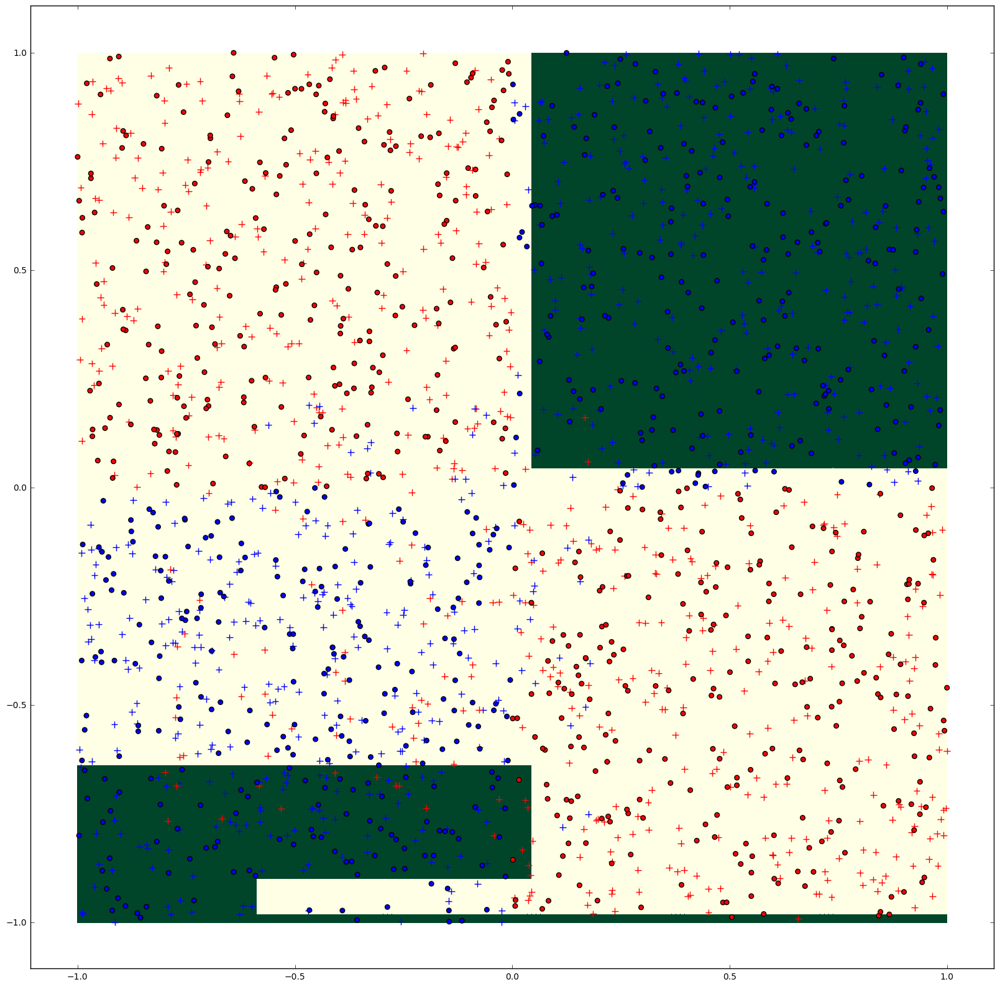

In [118]:
clf = Tree(criterion='gini', splitter='random', random_state=0, max_depth=3)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')


Depth 11
Train Accuracy = 0.886364
Test Accuracy = 0.930000


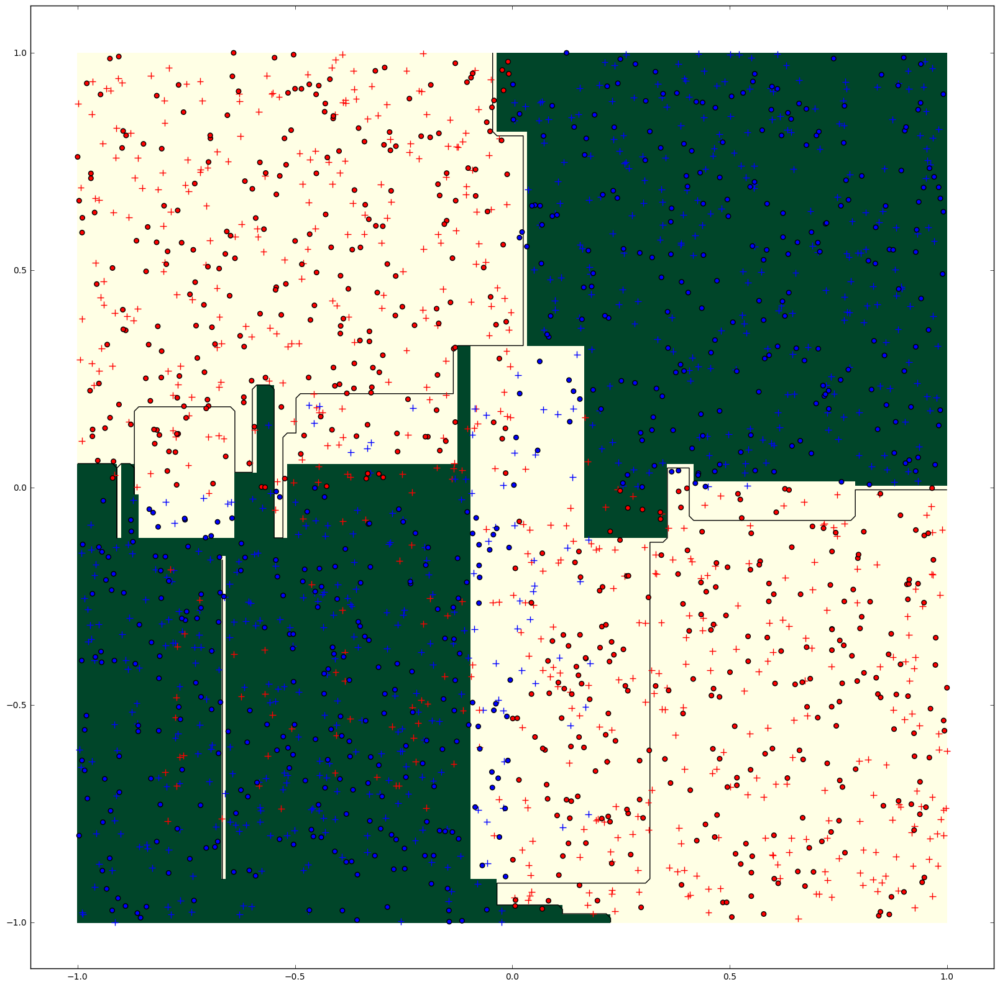

In [119]:
clf = Tree(criterion='gini', splitter='random', random_state=0, max_depth=11)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')


Depth 15
Train Accuracy = 0.946364
Test Accuracy = 0.933000


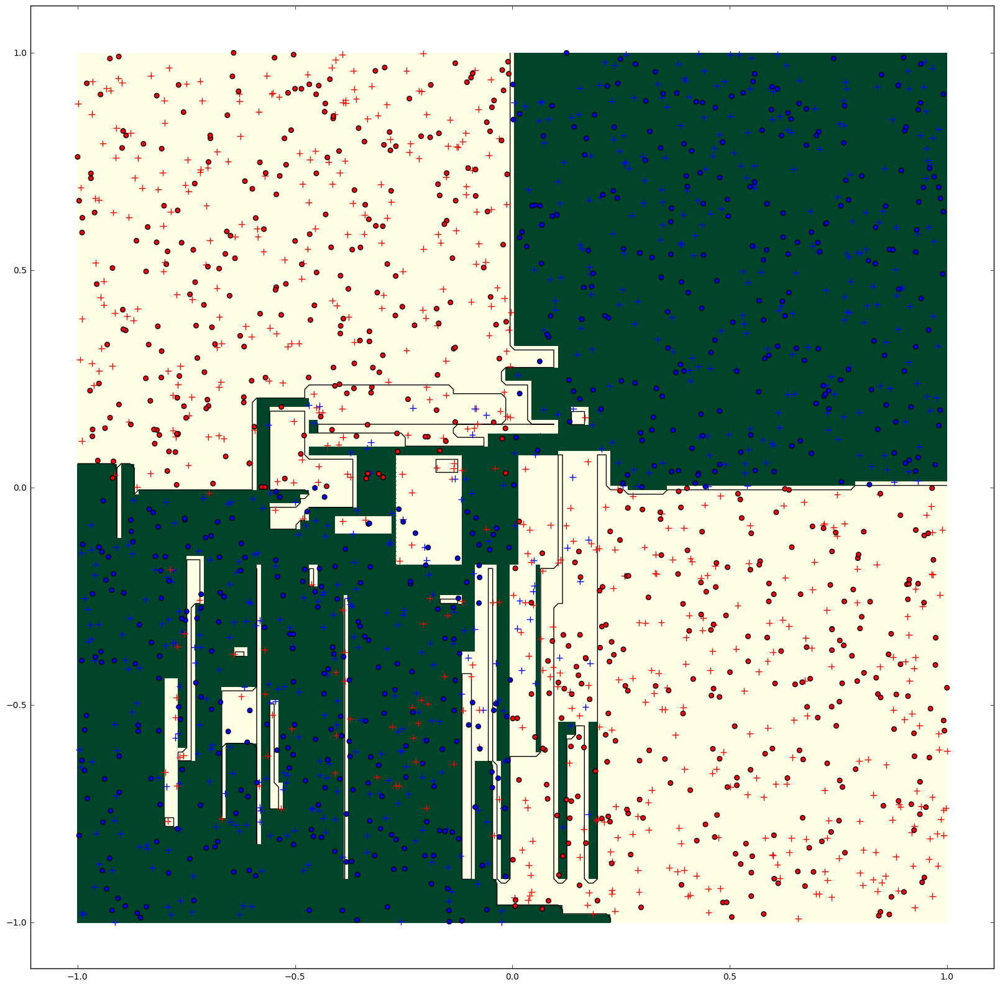

In [120]:
clf = Tree(criterion='gini', splitter='random', random_state=0, max_depth=15)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')

Finalmente comparamos ambos en un casos en un mismo grafico.

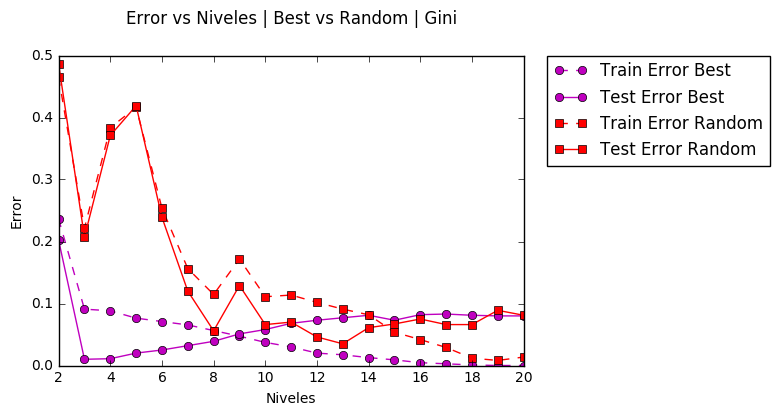

In [108]:
plt.plot(range(2, 21), tree_train, 'mo--', label='Train Error Best')
plt.plot(range(2, 21), tree_test, 'mo-', label= 'Test Error Best')
plt.plot(range(2, 21), tree_train2, 'rs--', label='Train Error Random')
plt.plot(range(2, 21), tree_test2, 'rs-', label= 'Test Error Random')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs Niveles | Best vs Random | Gini', y=1.08)
plt.xlabel('Niveles')
plt.ylabel('Error')
plt.show()

En esta grafica comparativa se observa la superioridad del *Splitter* *Best* por sobre *Random*, el cual, si bien se sobre ajusta más rápido que *Random*, en general tiene un mejor *Test Accuracy* que este, siendo ambos similares para números de niveles altos. 

### Árbol de clasificación con criterio Entropy

In [96]:
tree_train3 = []
tree_test3 = []

print "Multiples Niveles | Criterion = Entropy | Splitter = Best"
print "---------------------------------------------------------"

for n_t in range(2, 21):
    
    clf=Tree(criterion='entropy', splitter='best', random_state=0, max_depth=n_t)
    clf.fit(X_train, Y_train)
    
    print "\nDepth %d"%clf.tree_.max_depth
    
    acc_train = clf.score(X_train, Y_train)
    print "Train Accuracy = %f"%acc_train
    tree_train3.append(1 - acc_train)
    
    acc_test = clf.score(X_test, Y_test)
    print "Test Accuracy = %f"%acc_test
    tree_test3.append(1 - acc_test)
        
    print "--------------------------------------"

Multiples Niveles | Criterion = Entropy | Splitter = Best
---------------------------------------------------------

Depth 2
Train Accuracy = 0.532727
Test Accuracy = 0.481000
--------------------------------------

Depth 3
Train Accuracy = 0.625455
Test Accuracy = 0.565000
--------------------------------------

Depth 4
Train Accuracy = 0.900000
Test Accuracy = 0.975000
--------------------------------------

Depth 5
Train Accuracy = 0.900000
Test Accuracy = 0.975000
--------------------------------------

Depth 6
Train Accuracy = 0.916364
Test Accuracy = 0.980000
--------------------------------------

Depth 7
Train Accuracy = 0.921818
Test Accuracy = 0.975000
--------------------------------------

Depth 8
Train Accuracy = 0.925455
Test Accuracy = 0.974000
--------------------------------------

Depth 9
Train Accuracy = 0.937273
Test Accuracy = 0.961000
--------------------------------------

Depth 10
Train Accuracy = 0.944545
Test Accuracy = 0.953000
-------------------------------

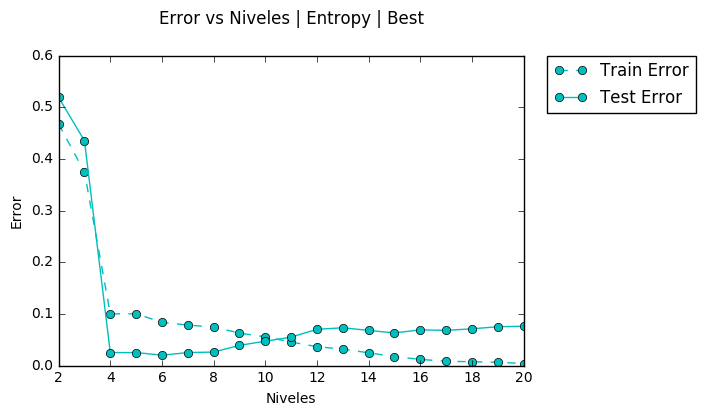

In [102]:
plt.plot(range(2, 21), tree_train3, 'co--', label='Train Error')
plt.plot(range(2, 21), tree_test3, 'co-', label= 'Test Error')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs Niveles | Entropy | Best', y=1.08)
plt.xlabel('Niveles')
plt.ylabel('Error')
plt.show()

En el grafico anterior observamos que con $6$ niveles se alcanza el mayor *Accuracy* de *Testing*, a medida que aumentamos el número de *niveles* observamos como el modelo empieza a sobre ajustarse, siendo el punto crítico la clasificación con $11$ niveles en donde el de prueba supera al de entrenamiento. Para arboles con niveles mayores a $11$ vemos como el error de entrenamiento disminuye y el de prueba aumenta, llegando a quedar completamente sobre ajustado hacia los últimos niveles.

A continuación, el grafico de los casos más significativos.


Depth 6
Train Accuracy = 0.916364
Test Accuracy = 0.980000


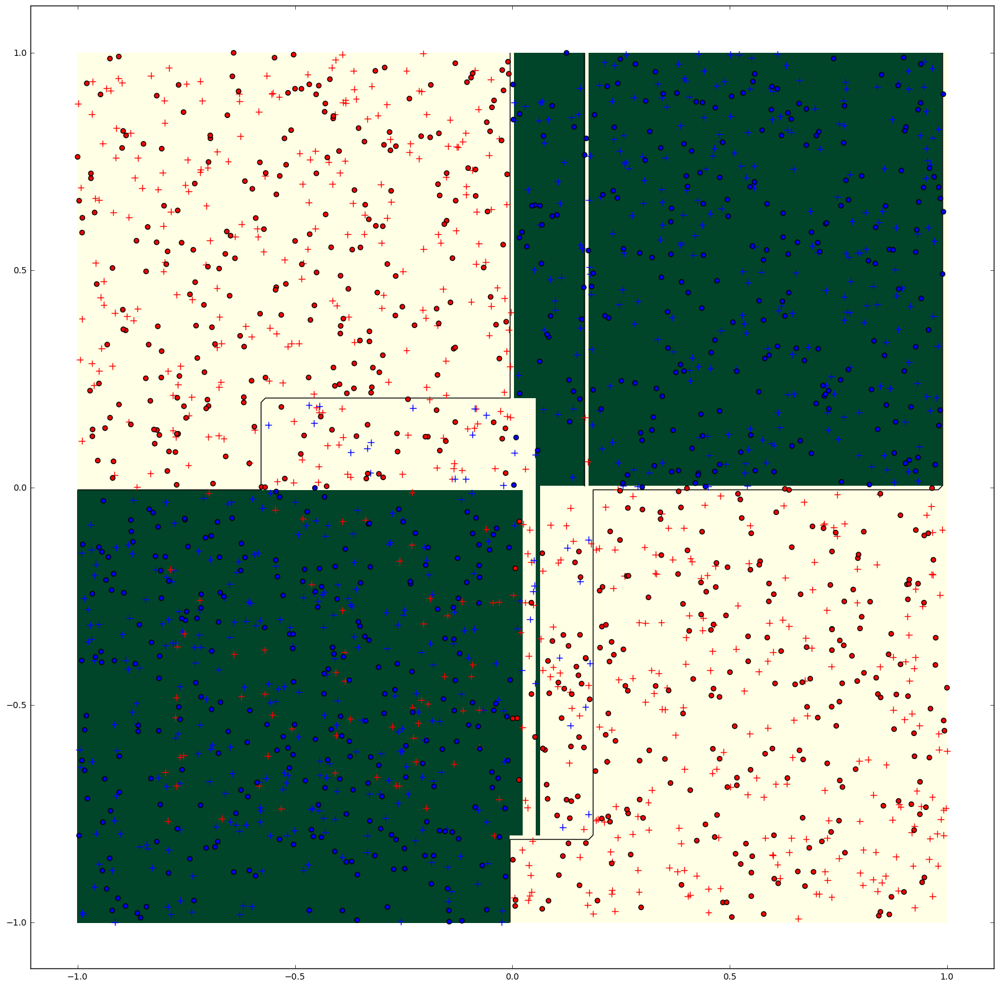

In [121]:
clf = Tree(criterion='entropy', splitter='best', random_state=0, max_depth=6)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')


Depth 11
Train Accuracy = 0.954545
Test Accuracy = 0.945000


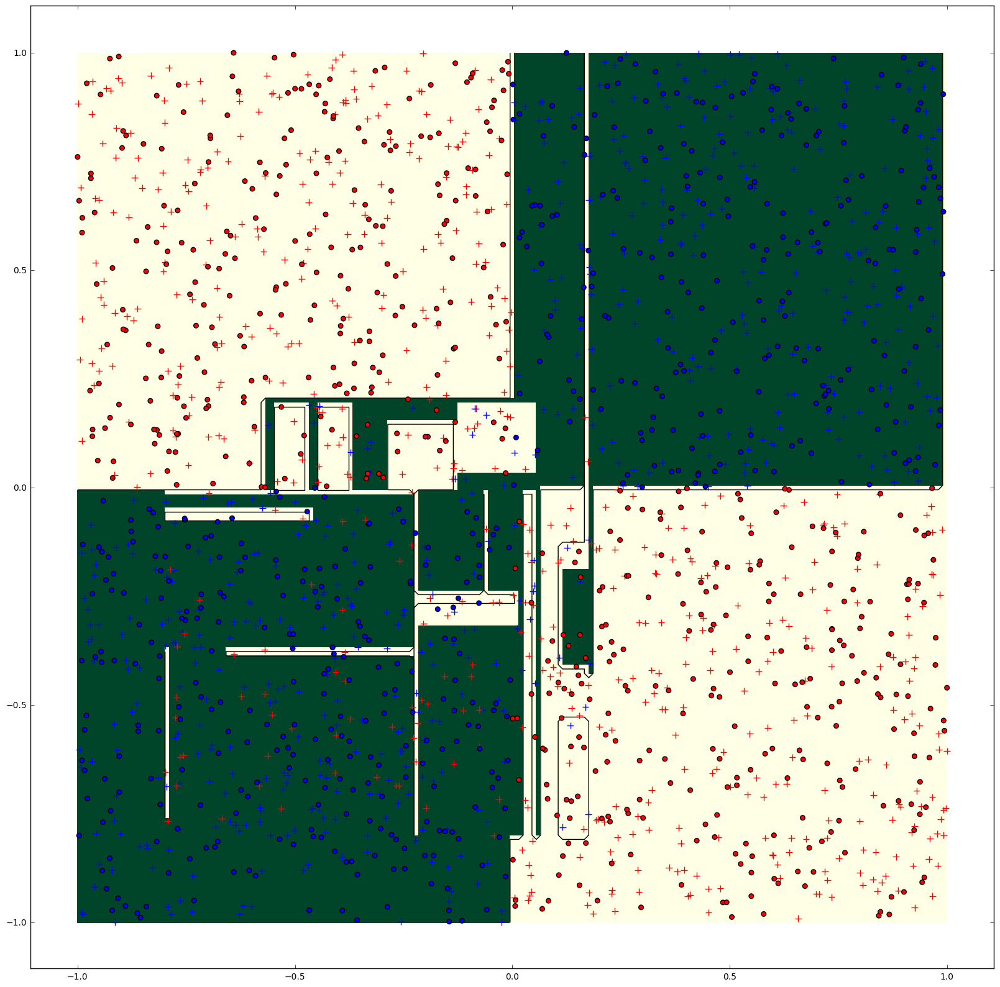

In [123]:
clf = Tree(criterion='entropy', splitter='best', random_state=0, max_depth=11)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')


Depth 20
Train Accuracy = 0.996364
Test Accuracy = 0.924000


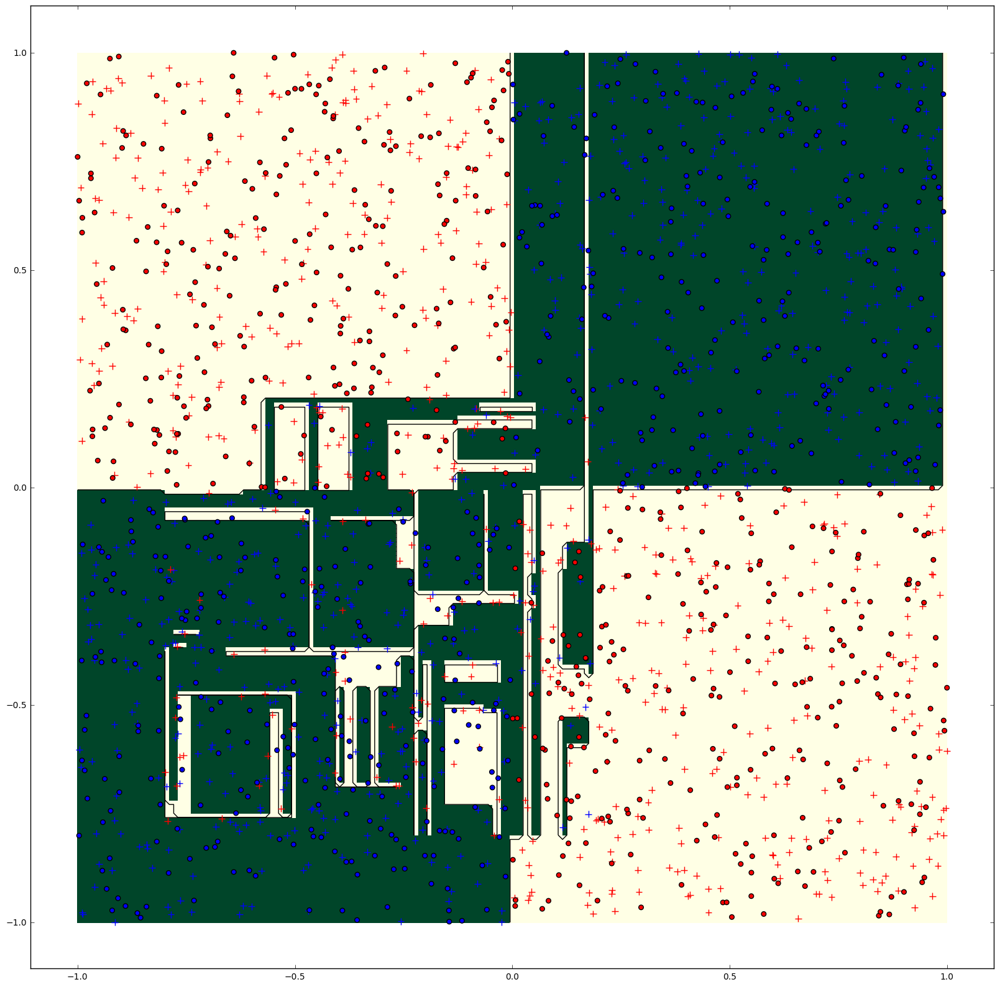

In [124]:
clf = Tree(criterion='entropy', splitter='best', random_state=0, max_depth=20)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')

Ahora usaremos el mismo criterio pero usando como splitter *Random*. 

In [100]:
tree_train4 = []
tree_test4 = []

print "Multiples Niveles | Criterion = Entropy | Splitter = Random"
print "---------------------------------------------------------"

for n_t in range(2, 21):
    
    clf=Tree(criterion='entropy', splitter='random', random_state=0, max_depth=n_t)
    clf.fit(X_train, Y_train)
    
    print "\nDepth %d"%clf.tree_.max_depth
    
    acc_train = clf.score(X_train, Y_train)
    print "Train Accuracy = %f"%acc_train
    tree_train4.append(1 - acc_train)
    
    acc_test = clf.score(X_test, Y_test)
    print "Test Accuracy = %f"%acc_test
    tree_test4.append(1 - acc_test)
        
    print "--------------------------------------"

Multiples Niveles | Criterion = Entropy | Splitter = Random
---------------------------------------------------------

Depth 2
Train Accuracy = 0.535455
Test Accuracy = 0.514000
--------------------------------------

Depth 3
Train Accuracy = 0.777273
Test Accuracy = 0.791000
--------------------------------------

Depth 4
Train Accuracy = 0.669091
Test Accuracy = 0.610000
--------------------------------------

Depth 5
Train Accuracy = 0.628182
Test Accuracy = 0.601000
--------------------------------------

Depth 6
Train Accuracy = 0.671818
Test Accuracy = 0.655000
--------------------------------------

Depth 7
Train Accuracy = 0.855455
Test Accuracy = 0.905000
--------------------------------------

Depth 8
Train Accuracy = 0.802727
Test Accuracy = 0.847000
--------------------------------------

Depth 9
Train Accuracy = 0.880909
Test Accuracy = 0.909000
--------------------------------------

Depth 10
Train Accuracy = 0.902727
Test Accuracy = 0.918000
-----------------------------

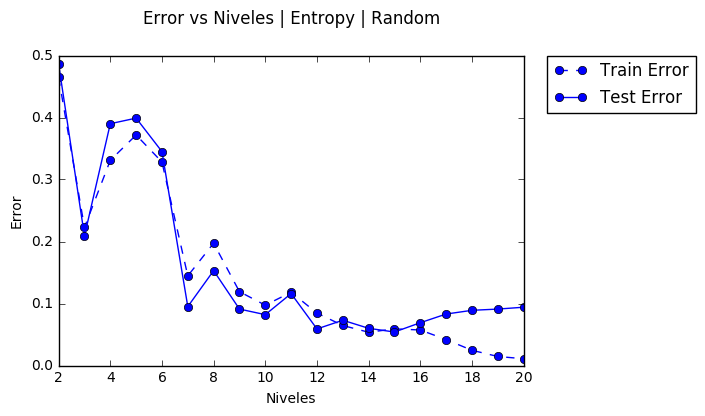

In [103]:
plt.plot(range(2, 21), tree_train4, 'bo--', label='Train Error')
plt.plot(range(2, 21), tree_test4, 'bo-', label= 'Test Error')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs Niveles | Entropy | Random', y=1.08)
plt.xlabel('Niveles')
plt.ylabel('Error')
plt.show()

Como observamos, al utilizar *random* como *splitter* el comportamiento del árbol de clasificación es errático, aumentado y disminuyendo el error entre niveles, sufirendo de sobreajuste para niveles sobre $11$.

A continuación, el grafico de los casos más significativos, niveles $3$, $11$ y $15$.


Depth 3
Train Accuracy = 0.777273
Test Accuracy = 0.791000


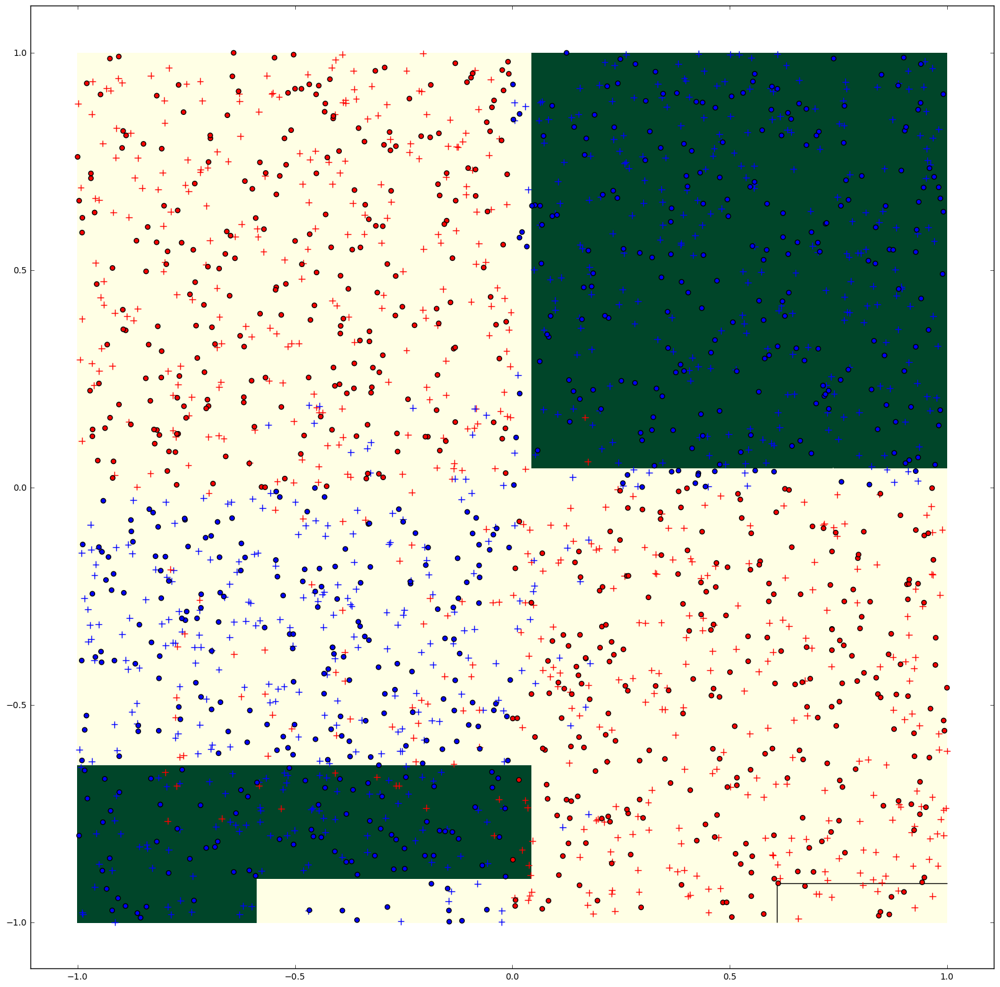

In [125]:
clf=Tree(criterion='entropy', splitter='random', random_state=0, max_depth=3)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')


Depth 11
Train Accuracy = 0.881818
Test Accuracy = 0.884000


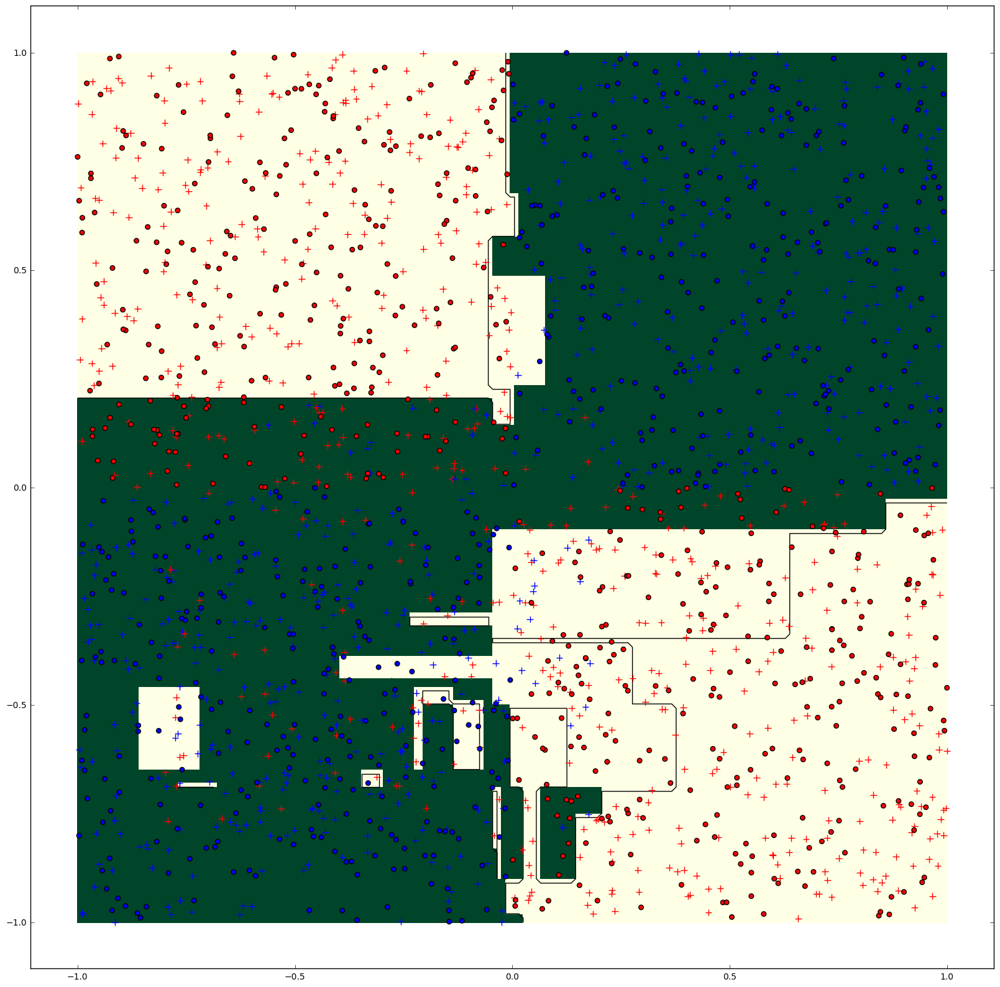

In [126]:
clf=Tree(criterion='entropy', splitter='random', random_state=0, max_depth=11)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')


Depth 15
Train Accuracy = 0.940909
Test Accuracy = 0.946000


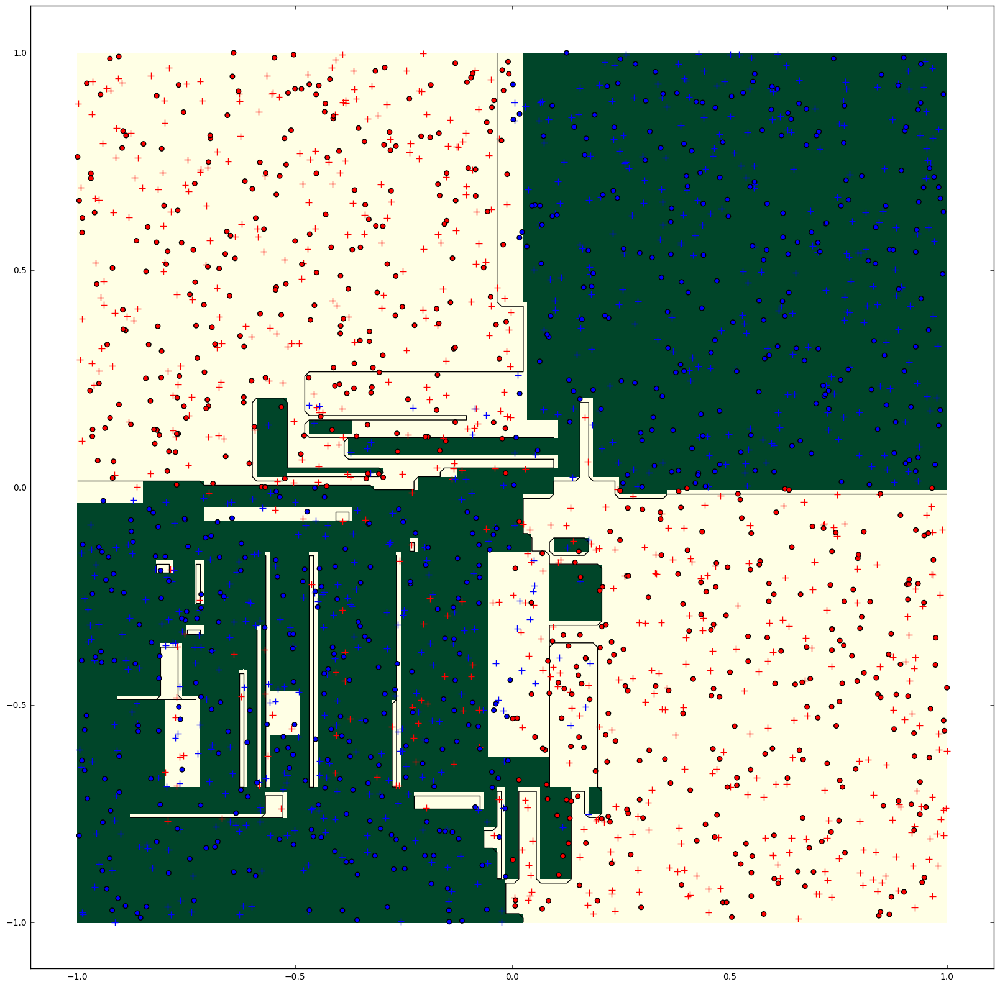

In [127]:
clf=Tree(criterion='entropy', splitter='random', random_state=0, max_depth=15)
clf.fit(X_train, Y_train)

print "\nDepth %d"%clf.tree_.max_depth

acc_train = clf.score(X_train, Y_train)
print "Train Accuracy = %f"%acc_train
tree_train.append(1 - acc_train)

acc_test = clf.score(X_test, Y_test)
print "Test Accuracy = %f"%acc_test
tree_test.append(1 - acc_test)

plot_classifier(clf, X_train, Y_train, X_test, Y_test,'tree')

Finalmente comparamos ambos en un casos en un mismo grafico.

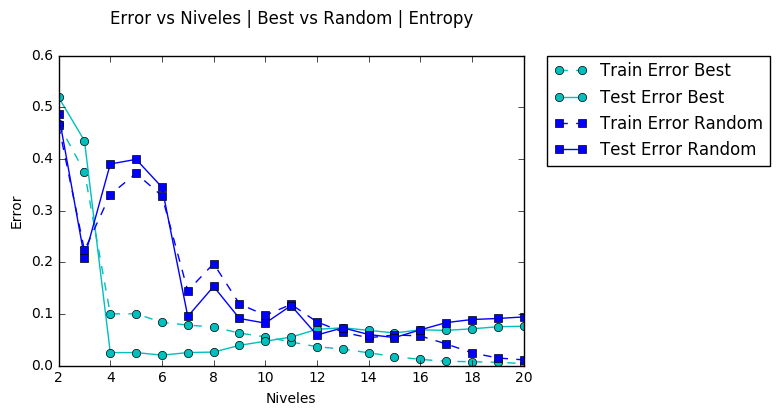

In [106]:
plt.plot(range(2, 21), tree_train3, 'co--', label='Train Error Best')
plt.plot(range(2, 21), tree_test3, 'co-', label= 'Test Error Best')
plt.plot(range(2, 21), tree_train4, 'bs--', label='Train Error Random')
plt.plot(range(2, 21), tree_test4, 'bs-', label= 'Test Error Random')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs Niveles | Best vs Random | Entropy', y=1.08)
plt.xlabel('Niveles')
plt.ylabel('Error')
plt.show()

En esta grafica comparativa se observa como el *Splitter* *Best* funciona mejor en la mayoria de los niveles con respecto a *Random*. En general tiene un mejor *Test Accuracy*, siendo ambos similares para números de niveles altos. 

### Comparativa

Finalmente generamos un gráfico con todas las variantes estudiadas a modo de comparativa. 

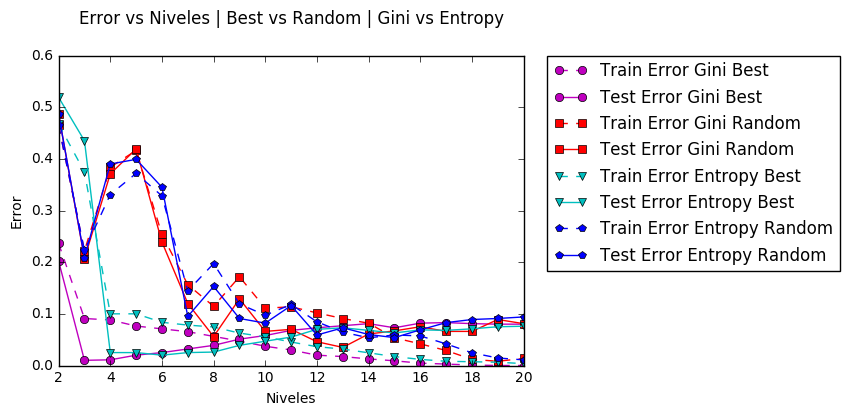

In [114]:
plt.plot(range(2, 21), tree_train, 'mo--', label= 'Train Error Gini Best')
plt.plot(range(2, 21), tree_test, 'mo-', label= 'Test Error Gini Best')
plt.plot(range(2, 21), tree_train2, 'rs--', label= 'Train Error Gini Random')
plt.plot(range(2, 21), tree_test2, 'rs-', label= 'Test Error Gini Random')
plt.plot(range(2, 21), tree_train3, 'cv--', label= 'Train Error Entropy Best')
plt.plot(range(2, 21), tree_test3, 'cv-', label= 'Test Error Entropy Best')
plt.plot(range(2, 21), tree_train4, 'bp--', label= 'Train Error Entropy Random')
plt.plot(range(2, 21), tree_test4, 'bp-', label= 'Test Error Entropy Random')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.title('Error vs Niveles | Best vs Random | Gini vs Entropy', y=1.08)
plt.xlabel('Niveles')
plt.ylabel('Error')
plt.show()

Finalmente observamos que el criterio a utilizar, sea *Gini* o *Entropy* no tiene un impacto significativo en la precisión, siendo similares para todos los niveles estudiados. Sin embargo la elección de un *splitter* posee un impacto significativo en la clasificación a todos los niveles, siendo *Gini* significativamente mejor que *Random*, entregando un *Accuracy* más elevado y presentando un comportamiento más estable que su contraparte.   